# 3 Preprocessing and Training Data Development at The end of the file<a id='3_Exploratory_Data_Analysis'></a>

## 3.1 Contents<a id='3.1_Contents'></a>
* [3 Exploratory Data Analysis](#3_Exploratory_Data_Analysis)
  * [3.1 Contents](#3.1_Contents)
  * [3.2 Introduction](#3.2_Introduction)
  * [3.3 Imports](#3.3_Imports)
  * [3.4 Load The Data](#3.4_Load_The_Data)
    * [3.4.1 Ski data](#3.4.1_Ski_data)
    * [3.4.2 State-wide summary data](#3.4.2_State-wide_summary_data)
  * [3.5 Explore The Data](#3.5_Explore_The_Data)
    * [3.5.1 Top States By Order Of Each Of The Summary Statistics](#3.5.1_Top_States_By_Order_Of_Each_Of_The_Summary_Statistics)
      * [3.5.1.1 Total state area](#3.5.1.1_Total_state_area)
      * [3.5.1.2 Total state population](#3.5.1.2_Total_state_population)
      * [3.5.1.3 Resorts per state](#3.5.1.3_Resorts_per_state)
      * [3.5.1.4 Total skiable area](#3.5.1.4_Total_skiable_area)
      * [3.5.1.5 Total night skiing area](#3.5.1.5_Total_night_skiing_area)
      * [3.5.1.6 Total days open](#3.5.1.6_Total_days_open)
    * [3.5.2 Resort density](#3.5.2_Resort_density)
      * [3.5.2.1 Top states by resort density](#3.5.2.1_Top_states_by_resort_density)
    * [3.5.3 Visualizing High Dimensional Data](#3.5.3_Visualizing_High_Dimensional_Data)
      * [3.5.3.1 Scale the data](#3.5.3.1_Scale_the_data)
        * [3.5.3.1.1 Verifying the scaling](#3.5.3.1.1_Verifying_the_scaling)
      * [3.5.3.2 Calculate the PCA transformation](#3.5.3.2_Calculate_the_PCA_transformation)
      * [3.5.3.3 Average ticket price by state](#3.5.3.3_Average_ticket_price_by_state)
      * [3.5.3.4 Adding average ticket price to scatter plot](#3.5.3.4_Adding_average_ticket_price_to_scatter_plot)
    * [3.5.4 Conclusion On How To Handle State Label](#3.5.4_Conclusion_On_How_To_Handle_State_Label)
    * [3.5.5 Ski Resort Numeric Data](#3.5.5_Ski_Resort_Numeric_Data)
      * [3.5.5.1 Feature engineering](#3.5.5.1_Feature_engineering)
      * [3.5.5.2 Feature correlation heatmap](#3.5.5.2_Feature_correlation_heatmap)
      * [3.5.5.3 Scatterplots of numeric features against ticket price](#3.5.5.3_Scatterplots_of_numeric_features_against_ticket_price)
  * [3.6 Summary](#3.6_Summary)


## 3.2 Introduction<a id='3.2_Introduction'></a>

At this point, you should have a firm idea of what your data science problem is and have the data you believe could help solve it. The business problem was a general one of modeling resort revenue. The data you started with contained some ticket price values, but with a number of missing values that led to several rows being dropped completely. You also had two kinds of ticket price. There were also some obvious issues with some of the other features in the data that, for example, led to one column being completely dropped, a data error corrected, and some other rows dropped. You also obtained some additional US state population and size data with which to augment the dataset, which also required some cleaning.

The data science problem you subsequently identified is to predict the adult weekend ticket price for ski resorts.

In [28]:
Inflation Modeling Capstone:

/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_89651/2786130087.py:1: FutureWarning: data_manager option is deprecated and will be removed in a future version. Only the BlockManager will be available.
  pd.reset_option('all')
/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_89651/2786130087.py:1: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  pd.reset_option('all')


In [166]:
import pandas as pd

In [168]:
pd.reset_option('all')

In [170]:
%reset -f

In [172]:
print(globals().keys())

dict_keys(['__name__', '__builtin__', '__builtins__', '_ih', '_oh', '_dh', 'In', 'Out', 'get_ipython', 'exit', 'quit', 'open', '_i', '_ii', '_iii', '_i171', 'json', 'getpass', 'hashlib', 'import_pandas_safely', '__pandas', 'is_data_frame', 'dataframe_columns', 'dtypes_str', 'dataframe_hash', 'get_dataframes', '_', '__', '___', '_171', '_i172'])


In [174]:
from IPython import get_ipython
get_ipython().magic('reset -f')

/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_88649/2165308485.py:2: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  get_ipython().magic('reset -f')


In [176]:
print(globals().keys())

dict_keys(['__name__', '__builtin__', '__builtins__', '_ih', '_oh', '_dh', 'In', 'Out', 'get_ipython', 'exit', 'quit', 'open', '_i', '_ii', '_iii', '_i175', 'json', 'getpass', 'hashlib', 'import_pandas_safely', '__pandas', 'is_data_frame', 'dataframe_columns', 'dtypes_str', 'dataframe_hash', 'get_dataframes', '_', '__', '___', '_175', '_i176'])


In [178]:
pd.reset_option('all')

NameError: name 'pd' is not defined

## 3.3 Imports<a id='3.3_Imports'></a>

In [16]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

from library.sb_utils import save_file
from scipy import stats
import random



ModuleNotFoundError: No module named 'library'

In [ ]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns # For all our visualization needs.
import statsmodels.api as sm # What does this do? Find out and type here.
from statsmodels.graphics.api import abline_plot # What does this do? Find out and type here.
from sklearn.metrics import mean_squared_error, r2_score # What does this do? Find out and type here.
from sklearn.model_selection import train_test_split #  What does this do? Find out and type here.
from sklearn import linear_model, preprocessing # What does this do? Find out and type here.
import warnings # For handling error messages.
# Don't worry about the following two instructions: they just suppress warnings that could occur later. 
warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.filterwarnings(action="ignore", module="scipy", message="^internal gelsd")

In [19]:
import statsmodels
import statsmodels.api as sm
import statsmodels.formula.api as smf

## 3.4 Load The Data<a id='3.4_Load_The_Data'></a>

### 3.4.1 Ski data<a id='3.4.1_Ski_data'></a>

In [23]:
df = pd.read_csv('../data/df_combined2.csv')

In [25]:
df.head()

,Date,Total Nonfarm Payroll (Source: U.S. Bureau of Labor Statistics),"Change in All Employees, Total Nonfarm (in thousands)","Recession (Yes = 1,000 and No = 0) With adjustments for date verification",Federal Funds Rate on the First of the Month (Source: 1954-7-1 - 2025-1-1 Federal Reserve Bank of New York; 1939-1-1 - 1954-6-1 Wall Street Journal ),Rate of Change of Federal Funds Rate,3 month moving average of the FFR,Unemployment Rate (Source: U.S. Bureau of Labor Statistics),Rate of change of Unemployment,Consumer Price Index Change (No factors removed) - As a Number not a percentage (Source: U.S. Bureau of Labor Statistics),...,26. Monthly Change in Total Non-Fram Payroll Per Captial,27. New Durable Goods Orders Per Capita,28. Residential Building Permits Per Capita,29. Debt held by the Public Per Capita,30. Debt held by the Public Per Capita: GDP Per Capita,31. Rate of change of Debt held by the Public Per Capita: GDP Per Capita,32. 6 month cumulative rate of change of Debt held by the Public Per Capita: GDP Per Capita,33. 12 month cumulative sum of New Durable Goods Orders Per Capita,34. Government Debt less debt held by the public as a per capita value,35. 12 month cumulative sum of new residential housing permits per capita
0,1939-01,29923.0,NaN,NaN,0.25,0.0,0.00,NaN,NaN,-1.408451,...,NaN,NaN,NaN,260.640137,0.386902,0,0,0,0,0
1,1939-02,30100.0,177.0,NaN,0.25,0.0,0.00,NaN,NaN,-1.418440,...,0.001357,NaN,NaN,263.104570,0.388602,0,0,0,0,0
2,1939-03,30280.0,180.0,NaN,0.25,0.0,0.25,NaN,NaN,-1.418440,...,0.001379,NaN,NaN,265.592305,0.390310,0,0,0,0,0
3,1939-04,30094.0,-186.0,`,0.25,0.0,0.25,NaN,NaN,-2.816901,...,-0.001424,NaN,NaN,268.103562,0.392025,0,0,0,0,0
4,1939-05,30299.0,205.0,NaN,0.25,0.0,0.25,NaN,NaN,-2.127660,...,0.001568,NaN,NaN,270.638564,0.393747,0,0,0,0,0


In [27]:
from IPython.display import display, HTML

#Code Create's a Table that can be scrolled through
html_table = df.to_html(classes='table table-bordered table-striped table-condensed', escape=False)
display(HTML(f'<div style="height: 1000px; overflow: auto;">{html_table}</div>'))

#We keep the command of adding a column number inactive to aviod repeatedly appending columns numbers e.g. 1.1.1, 2.2.2.
#df.columns = [f'{i}. {col}' for i, col in enumerate(df.columns)]

#df.iloc[0:1026, 17] = df.iloc[0:1026, 17].astype(float)

with pd.option_context('display.max_rows', None,   
                       'display.max_columns', None,  
                       'display.width', 1000,        
                       'display.max_colwidth', None): 
    df

,Date,Total Nonfarm Payroll (Source: U.S. Bureau of Labor Statistics),"Change in All Employees, Total Nonfarm (in thousands)","Recession (Yes = 1,000 and No = 0) With adjustments for date verification",Federal Funds Rate on the First of the Month (Source: 1954-7-1 - 2025-1-1 Federal Reserve Bank of New York; 1939-1-1 - 1954-6-1 Wall Street Journal ),Rate of Change of Federal Funds Rate,3 month moving average of the FFR,Unemployment Rate (Source: U.S. Bureau of Labor Statistics),Rate of change of Unemployment,Consumer Price Index Change (No factors removed) - As a Number not a percentage (Source: U.S. Bureau of Labor Statistics),Month over Month Change in CPI,Consumer Price Index 12 month Change (No factors removed) -,Federal Funds Rate on the First of the Month (As a percantage),Consumer Price Index Change (less food and energy) (Source: U.S. Bureau of Labor Statistics),3. Durable Goods Orders Transportation Included Actual (In millions of Dollars) (Source: U.S. Census Bureau),5. New Privately-Owned Housing Units Authorized in Permit-Issuing Places: Total Units (PERMIT) (Source: U.S. Federal Reserve Bank of St. Louis),5B. Building Permits Actual MOM Change,Total National Debt in millions (Source: Federal Reserve Bank of New York),Change in National Debt,Population (Source: U.S. Census Bureau),Total Federal Debt Held by the public in millions of dollars.,GDP in Millions of Dollars (Source Bureau of Economic Analysis),GDP per capita,Total index; SEASONALLY ADJUSTED CAPACITY UTILIZATION (Source: Board of Governers of the Federal Reserve Bank),Manufacturing (SIC);SEASONALLY ADJUSTED CAPACITY UTILIZATION (Source: Board of Governers of the Federal Reserve Bank),25. Total Non-Farm Payroll Per Capita,26. Monthly Change in Total Non-Fram Payroll Per Captial,27. New Durable Goods Orders Per Capita,28. Residential Building Permits Per Capita,29. Debt held by the Public Per Capita,30. Debt held by the Public Per Capita: GDP Per Capita,31. Rate of change of Debt held by the Public Per Capita: GDP Per Capita,32. 6 month cumulative rate of change of Debt held by the Public Per Capita: GDP Per Capita,33. 12 month cumulative sum of New Durable Goods Orders Per Capita,34. Government Debt less debt held by the public as a per capita value,35. 12 month cumulative sum of new residential housing permits per capita
0,1939-01,29923.0,NaN,NaN,0.25000,0.00000,0.000000,NaN,NaN,-1.408451,0.000000,-0.014085,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.303978e+08,3.398689e+04,8.784358e+04,673.658618,NaN,NaN,0.229475,NaN,NaN,NaN,260.640137,0.386902,0,0,0,0,0
1,1939-02,30100.0,177.0,NaN,0.25000,0.00000,0.000000,NaN,NaN,-1.418440,-0.007143,-0.014184,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.304741e+08,3.432833e+04,8.833792e+04,677.053385,NaN,NaN,0.230697,0.001357,NaN,NaN,263.104570,0.388602,0,0,0,0,0
2,1939-03,30280.0,180.0,NaN,0.25000,0.00000,0.250000,NaN,NaN,-1.418440,0.000000,-0.014184,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.305505e+08,3.467320e+04,8.883505e+04,680.465259,NaN,NaN,0.231941,0.001379,NaN,NaN,265.592305,0.390310,0,0,0,0,0
3,1939-04,30094.0,-186.0,`,0.25000,0.00000,0.250000,NaN,NaN,-2.816901,-0.007194,-0.028169,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.306269e+08,3.502153e+04,8.933498e+04,683.894327,NaN,NaN,0.230381,-0.001424,NaN,NaN,268.103562,0.392025,0,0,0,0,0
4,1939-05,30299.0,205.0,NaN,0.25000,0.00000,0.250000,NaN,NaN,-2.127660,0.000000,-0.021277,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.307033e+08,3.537336e+04,8.983772e+04,687.340674,NaN,NaN,0.231815,0.001568,NaN,NaN,270.638564,0.393747,0,0,0,0,0
5,1939-06,30502.0,203.0,NaN,0.25000,0.00000,0.250000,NaN,NaN,-2.127660,0.000000,-0.021277,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.307798e+08,3.572873e+04,9.034328e+04,690.804389,NaN,NaN,0.233232,0.001552,NaN,NaN,273.197535,0.395477,0,0,0,0,0
6,1939-07,30419.0,-83.0,NaN,0.25000,0.00000,0.250000,NaN,NaN,-2.127660,0.000000,-0.021277,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.308564e+08,3.608766e+04,9.085170e+04,694.285559,NaN,NaN,0.232461,-0.000634,NaN,NaN,275.780703,0.397215,0,0,0,0,0
7,1939-08,30663.0,244.0,NaN,0.25000,0.00000,0.

In [28]:
Where we left off:

#At this point we need to determine what graphs of the data we want to visualize
#We may need to add columns to the existing dataframe with new types of data
#We likely want to see an interquartile range for Debt growth per capita: GDP per capita 
#We want a chart of consecutive months of recession
#We may want to see the distribution of data
#We may want to see some relationships between data such as comparing Inflation to increase in debt held by the public
#We may want to see some relationships such as values as a ratio to population
#Values that we may want to see as a ratio to population include: 1. non-Farm-Payrolls per capita, 2. Change in non-Farm Payrolls per capita 3. new-durable goods orders per capita 
#4. residential building permints per capita 5. Change in total federal debt held by the public per capita
#We probably want to see some moving averages including change in non-Farm Payrolls as a 6 month and 12 month average, 
#Looking at monthly data and data chnages does not always tell the story we want to hear. 
#We need to consider the  6 month change, 12 month change and the 24 month change of some measures:
#We need to consider the cumulative prior 6 and 12 months of factors such as 1.housing permits 2. change in ratio of debt held by public per capita to 
#GDP per capita - this cumulation as this cumulation reduces influence of monthly fluxuations 
#We need to take ratios of some value per capita as a ration to the GDP per capita 
#Consider 6 month and 12 month change in ratio of the debt held by the public per capita: GDP per capita and then graph that against inflation 
#There is a delay between an event that causes the inflation and the inflation itself and so we may need staggered modeling which may be the 12 month change
#We need to look at a few other factors
1. Quantitative easing - this is essentially the increase in national debt less the increase in debt held by the public
2. Projections on the Rate of change of social security payments and medicare payments and medicaid payments less the rate of increase of the Federal tax revenue
Although, this value could relate to quantitative easing and rather 
3. We want a sense of how quantitative easing will increase in the future. 





SyntaxError: invalid syntax (1223308708.py, line 1)

In [30]:
#At this point it makes some sense to dig into the data we have rather than get some new data
#Although, we want to point out looking at the share of persons older than 65 as a percentage of the population could be informative 
#Additionally, we need to collect some qualitative data on the casues of each major inflation event.  
#This includes pandemics, wars and various fiscal policies such as the subprime crises. We will look for anything that can logically explain the inflation or deflation by considering the 
#cost and timeing.   As an example, it is no mystery that World War II had an estimated cost of $4 Trillion dollars (inflation adjusted)  Similiarly, the cost of COVID-19
#Is estimated to be as much as $10 Trillion making it the most expensive event in U.S. history.  What about a correction in the stock market does that cause inflation or does 
too much of an increase in the stock market cause inflation?  We also, have to understand not to gove beyond the scope of the project.
#We need to look at different events and their timing.  

#OK, before we do that we need to first do a few things
#1. We need a basic plot of the FFR, Inflation, unemployment and recessions
#2. Weed need to consider things happening at 6 months 12 months and 18 or 24 months whether as a moving average or an accumulation.  
#Perhaps an accumulation looks better because a moving average acts to reduce relative differences where an an accumulation would make those differences stand out more
#Finally, we need to look at things on a per capita basis becasue if there is more population then there can be more debt, more GDP, etc.
#But two more things we need to conside time series data and whether or not we want to consider things 18 months prior to an inflation, and 18 months after an inflation \
#as separated from other data. This should make influencing factors standout more. We wonder if there are factors that are only at work once thresholds are crossed and 
# and if there is an insufficient number of threshold crossing events relative to the amound of data we have
#There is also the matter of how we create training sets for statistical models.  Our thinking is that we want to keep things in a cycle togehter.

#Enough, rambling lets get started.

#Lets then decide what we want a 6 months, 12 months and 18 or 24 months
#We will generate different dataframes for each.


We have already decided on some of these things.
Nonrecurring items can be accumulated recurring items can only be accumulated by their change.
1. Total Non-Farm Payroll Per Capita - cannot do an accumulation  (Column 25) 
2. Change in All Employees, Total Nonfarm per capita - can do an accumulation ((Column 26)
3. Federal Funds Rate (Column 4)
4. Rate of Change of the Federal Funds rate - can do an accumulation (Column 5)
5. Unemplopyment rate - cannot do an accumulation (Column 7)
6. Rate of change of unemployment rate - can do an accumulation (Column 8)
Consumer price index - this is inflation so it is the dependent variable remember this is only the 12 month chang inflation
Cumulative inflation - this could be another dependent varaible it matters when you looking back more than 12 months becasue if we look back 24 months some of the inflation
has already happened and would not be accounted for.  To get cumulative inflation we can annually compound inflation. 
7.  New Durable goods orders per capita - can do an accumulation (Column 27 - DATA ONLY GOES AS FAR BACK AS 1992 
ALTHOUGH THERE MAY BE SOME OTHER RECORD PRIOR TO THEN THAT THE FED DOES NOT MAKE IT READILY AVAIALABLE 
8.  Change in New durable goods orders per capita - can do an accumulation (Generate from Column 27)
9.  Residential Building permits per capita - can do an accumulation (Column 28)
10. Change in residential building permits per capita - can do an accumulation (Generate from Column 28)
11. Debt held by the public per capita - cannot do an accumulation - (Column 29)
12. Change in debt held by the public per capita - can do an cumulation - (Generate from Column 29)
13. Change in Debt held by the treasury - Quantitative Easing/Quantiative tighetning - PER CAPITA
14. Ratio of Debt held by the public per capita: GDP per captia (Column 30)
15. Change in Ratio of Debt held by the public per capita: GDP per capital - (Generate from column 30)
15. TOTAL SEASONALLY ADJUSTED CAPACITY UTILIZATION - (Column 23)
16. MANUFACTURING ADJUSTED CAPACITY UTILIZATION - (Column 24)

OK we organized the data into 4 categories
Category A: Rate Data of Any kind
Category B: Rate of change of rate data 
Category C: Per Captia Data
CAtegory D: Rate of Change or Accumulation of Per capita data 
Category E: Was there a recession

Non per capital data
A. Federal Funds Rate (Column 4)
B. Unemplopyment rate - cannot do an accumulation (Column 7)
C. TOTAL SEASONALLY ADJUSTED CAPACITY UTILIZATION - (Column 23) 
D. MANUFACTURING Seasonally ADJUSTED CAPACITY UTILIZATION - (Column 24)

Non per capita rate of change - will need 1 month, 6 month, 12 month, 24 month and 60 month. 
We will start with a change but if we do not like the result we will consider moving averages later. 
E. Rate of Change of the Federal Funds rate - can do an accumulation (Column 5)
F. Rate of change of unemployment rate - can do an accumulation (Column 8)
G. TOTAL SEASONALLY ADJUSTED CAPACITY UTILIZATION Rate of Change - (Generate from Column 23)
H. MANUFACTURING Seasonally ADJUSTED CAPACITY UTILIZATION Rate of Change - (Generate from Column 24) 

Unmodified Per capita data
1. Total Non-Farm Payroll Per Capita - cannot do an accumulation  (Column 25)
2. New Durable goods orders per capita - can do an accumulation (Column 27 - DATA ONLY GOES AS FAR BACK AS 1992
3. Debt held by the public per capita - cannot do an accumulation - (Column 29)
4. Ratio of Debt held by the public per capita: GDP per captia (Column 30)
5. Residential Building permits per capita - can do an accumulation (Column 28)
6. Debt held by the treasury per capita - Quantitative Easing/Quantitative Tightening (Can be be generated from )
7. GDP per capita

Per capita rate of change or cumulative sum - will need 1 month, 6 month, 12 month, 24 month and 60 month. 
8.  Change in All Employees, Total Nonfarm per capita - can do an accumulation (Column 26) -    Column 26
9.  Change in New durable goods orders per capita: GDP per capita - can do an accumulation (Generate from Column 27) - Generated as Column 36
10.  Change in residential building permits per capita - can do an accumulation (Generate from Column 28)  - Generated as Column 37
11. Rate of change of Debt Held by the Government per capita: GDP per capita (Generate in Column 34) - Generated as Column 34                                                      
12. Change in Ratio of Debt held by the public per capita: GDP per capital - (Generate from column 30) - Generated as Column 31
14. 24 month percent change in GDP per capita
15. 12 month percent change in GDP per capita 
                                                                  
Category E - Was there a Recession
1. Recession - Yes or No - Column 3 - We have this as a kind of binary 1000 = Yes, 0 = No

What is missing?
Cumulative Inflation - We need cumulative inflation for some period of time perhaps 24 month and 36 month and 60 month
Cumulative inflation is easy to generate becasue we can just compound back. E.g. 24 month cumulative inflation is just calculated as follows:
    We just compound with the same month one year earlier.  
    If we want 36 month cumularive inflation we compound with the same month one year earlier and then with the same month 2 years earlier.
Inflation is reported as a 12 month rate of change.
    If we want 18 month or 6 month it is a bit more complicated but we can can actually just take the buying power of $1000 of each of 
    the 12 months in 1940 and then use the inflation information to calculate combined with our CPI data to get the inflation adjusted value
    of $1000 for every month between January 1940 and December 2024. We can use the following CPI inflation calculator from the Bureau of 
    Labor Statistics to do that: https://www.bls.gov/data/inflation_calculator.htm

Here are the numbers: 

January 1980: $1007.19
February 1980:  $1014.14
March 1980: $1029.56
April 1980: $1041.93
May 1980: $1051.41
June 1980: $1062.98
July 1980: $1062.98
August 1980: $1070.69
September 1980: $1079.69
October 1980: $1089.97
November 1980: $1098.97
December 1980: $1109.25

We will get to this after generating all our dataframes? 

Other items that need addressing:
We need to fill in missing 2024 data for debt and GDP.  


SyntaxError: invalid syntax (2607092096.py, line 7)

In [31]:
#Fill missing data for debt and GDP
#It actually makes more sense to fill in the data in our prior workbook and just rerun everything so we have all the data since we have already implemented this code earlier.

#Missing 2024 GDP
#df.iloc[1032, 21] = 29167770

#Missing 2024 Debt Held by the public
#df.iloc[1032, 20] = 26235602

#We went back to the Data Wrangling notebook and filled in the data there



In [32]:
#OK Lets now build up our missing data
#Lets Start with Column 31 - 1 Month Change in Ratio of Debt held by the public per capita: GDP per capital - (Generate from column 30)



# We use a for loop to iterate our calculation  
for i in range(len(df)):
        df.iloc[i, 31] = (df.iloc[i, 30] - df.iloc[i-1, 30]) 


In [37]:
df.iloc[0, 31] = 0

In [39]:
#Columns we need to Now Generate:
#Change in Debt held by the Federal Government PEr capita - This includes Quantitative Easing/Quantiative tighetning as well as debt owed to the government
#such as borrowing from Social Security. - PER CAPITA - (Column 34 needs to be populated)

df.columns.values[34] = '34. Ratio of Monthly Change in Debt Held by the Government per capita: GDP per capita'
for i in range(len(df)):
        df.iloc[i, 34] = ((((df.iloc[i, 17] - df.iloc[i, 20])/ df.iloc[i, 19]) - ((df.iloc[i-1, 17] - df.iloc[i-1, 20])/ (df.iloc[i-1, 19])))*10**6)/((df.iloc[i, 22]))
df.iloc[0, 34] = 0


In [41]:
#Generate Some New Columns
df['36.'] = 0
df['37.'] = 0
df['38.'] = 0
df['39.'] = 0
df['40.'] = 0
df['41.'] = 0
df['42.'] = 0
df['43.'] = 0
df['44.'] = 0
df['45.'] = 0
df['46.'] = 0
df['47.'] = 0
df['48.'] = 0
df['49.'] = 0
df['50.'] = 0
df['51.'] = 0
df['52.'] = 0
df['53.'] = 0
df['54.'] = 0
df['55.'] = 0
df['56.'] = 0
df['57.'] = 0
df['58.'] = 0
df['59.'] = 0
df['60.'] = 0
df['61.'] = 0
df['62.'] = 0
df['63.'] = 0
df['64.'] = 0



In [42]:
#Generate Some New Columns
df['65.'] = 0
df['66.'] = 0
df['67.'] = 0
df['68.'] = 0
df['69.'] = 0
df['70.'] = 0

In [45]:
#Change in New durable goods orders per capita: GDP per capita

df.columns.values[36] = '36. Ratio of Monthly change of New Durable goods orders per capita: GDP per capita'
for i in range(len(df)):
        df.iloc[i, 36] = (df.iloc[i, 27] - df.iloc[i-1, 27])/ df.iloc[i, 22]
df.iloc[0, 36] = 0

In [47]:
df = df.iloc[:1032]

In [49]:
#Monthly Change in residential building permits per capita

df.columns.values[37] = '37. Monthly Change in residential building permits per capita'
for i in range(len(df)):
        df.iloc[i, 37] = (df.iloc[i, 28] - df.iloc[i-1, 28])
#df.iloc[0, 37] = 0



In [51]:
df.columns.values[10] = '10. Month over Month Change in CPI (Source: CPI Inflation Calculator U.S. Bureau of Labor Statistics)'

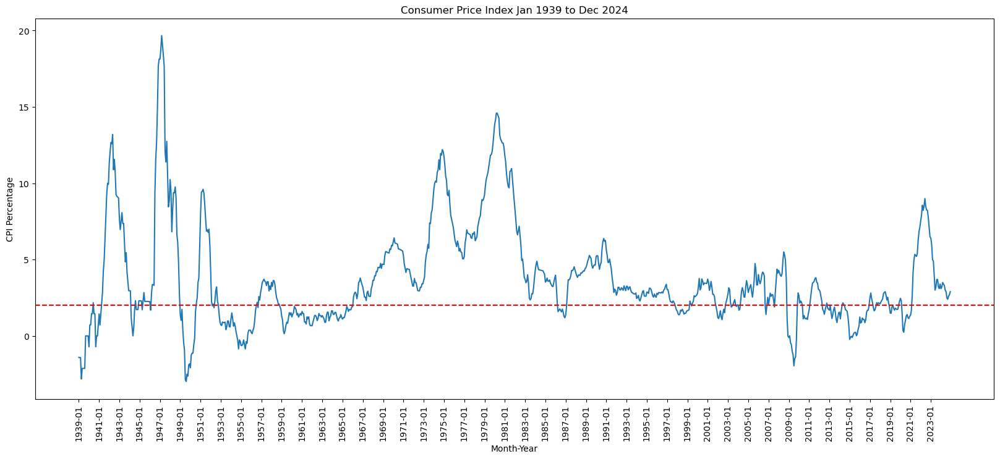

In [53]:
#At this Stage it makes sense to make a simple plot of the Consumer Price Index.  Why do we want this plot.
#The policy of the Federal Reserve Board of Governers is to keep inflation around 2.0%  
#We want to get a sense of what duration inflation remains above 2.0% for any period of time and the average 
#of that time could be the target maximum period to consider a cumulative change for.  

plt.figure(figsize=(20, 8))
plt.plot(df.iloc[:, 0], df.iloc[:, 9])
plt.axhline(y=2, color='r', linestyle='--')
plt.xticks(range(0, len(df), 24))
#plt.xticks(range(0, len(df), 6), labels=[])
plt.title("Consumer Price Index Jan 1939 to Dec 2024")
plt.xticks(rotation=90)
plt.xlabel("Month-Year")
plt.ylabel("CPI Percentage")
plt.show()




In [55]:
Reviewing this graph we will we will generate our 12 month change data, 24 month and 42 month change: 

SyntaxError: invalid syntax (3174640283.py, line 1)

In [57]:

Per capita rate of change or cumulative sum - will need 1 month, 6 month, 12 month, 24 month and 60 month. 
12 month Change in All Employees, Total Nonfarm per capita - can do an accumulation (Column 26) -    Column 26
12 month Change in New durable goods orders per capita: GDP per capita - can do an accumulation (Generate from Column 27) - Generated as Column 36
12 month Change in residential building permits per capita - can do an accumulation (Generate from Column 28)  - Generated as Column 37
12 month change of Debt Held by the Government per capita: GDP per capita (Generate in Column 34) - Generated as Column 34
12 month Change in Ratio of Debt held by the public per capita: GDP per capital - (Generate from column 30) - Generated as Column 31





SyntaxError: invalid syntax (132760198.py, line 1)

In [59]:
Lets start at 24 months
7.  Change in All Employees, Total Nonfarm per capita - can do an accumulation (Column 26) -    Column 26
8.  Change in New durable goods orders per capita: GDP per capita - can do an accumulation (Generate from Column 27) - Generated as Column 36
9.  Change in residential building permits per capita - can do an accumulation (Generate from Column 28)  - Generated as Column 37
10. Rate of change of Debt Held by the Government per capita: GDP per capita (Generate in Column 34) - Generated as Column 34
11. Change in Ratio of Debt held by the public per capita: GDP per capital - (Generate from column 30) - Generated as Column 31




SyntaxError: invalid syntax (1002419951.py, line 1)

In [61]:
#24 month difference in All Employees, Total Nonfarm per capita

df.columns.values[38] = '38. 24 month difference in All Employees, Total Nonfarm per capita'
for i in range(len(df)):
        df.iloc[i, 38] = (df.iloc[i, 25] - df.iloc[i-24, 25])
df.iloc[0:24, 38] = 0


/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/4268838919.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.2309005242712042' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.iloc[i, 38] = (df.iloc[i, 25] - df.iloc[i-24, 25])


In [63]:
#12 month difference in All Employees, Total Nonfarm Payroll per capita

df.columns.values[51] = '12 month difference in All Employees, Total Nonfarm Payroll per capita'
for i in range(len(df)):
        df.iloc[i, 51] = (df.iloc[i, 25] - df.iloc[i-12, 25])
df.iloc[0:12, 51] = 0

/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/767788910.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.2358752482612905' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.iloc[i, 51] = (df.iloc[i, 25] - df.iloc[i-12, 25])


In [65]:
#42 month difference in All Employees, Total Nonfarm Payroll per capita

df.columns.values[52] = '42 month difference in All Employees, Total Nonfarm Payroll per capita'
for i in range(len(df)):
        df.iloc[i, 52] = (df.iloc[i, 25] - df.iloc[i-42, 25])
df.iloc[0:42, 52] = 0

/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/2676433540.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.21061764872187602' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.iloc[i, 52] = (df.iloc[i, 25] - df.iloc[i-42, 25])


In [67]:
#One of the issues with new durable goods orders is that we only starting collecing data on it in 1992.  

#24 month cumulative Change in New durable goods orders per capita: GDP per capita

df.columns.values[39] = '39. 24 month change of (New Durable goods orders per capita: GDP per capita)'
for i in range(len(df)):
        df.iloc[i, 39] = (df.iloc[i, 27]/df.iloc[i, 22]) - (df.iloc[i-24, 27]/ df.iloc[i-24, 22])
df.iloc[637:660, 39] = 0

In [69]:
#12 month cumulative Change in New durable goods orders per capita: GDP per capita

df.columns.values[53] = '53. 12 month change of (New Durable goods orders per capita: GDP per capita)'
for i in range(len(df)):
        df.iloc[i, 53] = (df.iloc[i, 27]/df.iloc[i, 22]) - (df.iloc[i-12, 27]/ df.iloc[i-12, 22])
df.iloc[637:650, 53] = 0

In [71]:
#42 month cumulative Change in New durable goods orders per capita: GDP per capita

df.columns.values[54] = '53. 42 month change of (New Durable goods orders per capita: GDP per capita)'
for i in range(len(df)):
        df.iloc[i, 54] = (df.iloc[i, 27]/df.iloc[i, 22]) - (df.iloc[i-42, 27]/ df.iloc[i-42, 22])
df.iloc[637:680, 53] = 0

In [73]:
#24 Monthl Change in residential building permits per capita

df.columns.values[40] = '40. 24 Month Change in residential building permits per capita'
for i in range(len(df)):
        df.iloc[i, 40] = (df.iloc[i, 28] - df.iloc[i-24, 28])
df.iloc[0:274, 40] = 0


In [75]:
#12 Monthl Change in residential building permits per capita

df.columns.values[59] = '59. 12 Month Change in residential building permits per capita'
for i in range(len(df)):
        df.iloc[i, 59] = (df.iloc[i, 28] - df.iloc[i-12, 28])
df.iloc[0:262, 59] = 0


In [77]:
#42 Monthl Change in residential building permits per capita

df.columns.values[60] = '60. 42 Month Change in residential building permits per capita'
for i in range(len(df)):
        df.iloc[i, 60] = (df.iloc[i, 28] - df.iloc[i-42, 28])
df.iloc[0:292, 60] = 0


In [79]:
#24 Month Change in Debt held by the public Per captia: GDP per captia

df.columns.values[41] = '41. 24 Month Change in debt held by the public Per captia: GDP per captia'
for i in range(len(df)):
        df.iloc[i, 41] = (df.iloc[i, 30] - df.iloc[i-24, 30])
df.iloc[0:24, 41] = 0


/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/2907417268.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.47144038632724067' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.iloc[i, 41] = (df.iloc[i, 30] - df.iloc[i-24, 30])


In [81]:
#12 Month Change in Debt held by the public Per captia: GDP per captia

df.columns.values[61] = '61. 12 Month Change in debt held by the public Per captia: GDP per captia'
for i in range(len(df)):
        df.iloc[i, 61] = (df.iloc[i, 30] - df.iloc[i-12, 30])
df.iloc[0:12, 61] = 0

/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/187757941.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.4900391743816071' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.iloc[i, 61] = (df.iloc[i, 30] - df.iloc[i-12, 30])


In [83]:
#42 Month Change in Debt held by the public Per captia: GDP per captia

df.columns.values[62] = '62. 42 Month Change in debt held by the public Per captia: GDP per captia'
for i in range(len(df)):
        df.iloc[i, 62] = (df.iloc[i, 30] - df.iloc[i-42, 30])
df.iloc[0:12, 62] = 0

/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/3526697049.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.4571373794359522' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.iloc[i, 62] = (df.iloc[i, 30] - df.iloc[i-42, 30])


In [85]:
df.iloc [:, 17] = df.iloc[:, 17].fillna(0).astype(float)

In [87]:
#66 Total of (National Debt and Debt Held by the public):GDP

df.columns.values[66] = '66. Total of (National Debt and Debt Held by the public):GDP'
for i in range(len(df)):
        df.iloc[i, 66] = ((df.iloc[i, 17] + df.iloc[i, 20]) / df.iloc[i, 21])

/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/3381538357.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.3869024009172147' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.iloc[i, 66] = ((df.iloc[i, 17] + df.iloc[i, 20]) / df.iloc[i, 21])


In [89]:
df.columns.values[67] = '67. Total of National Debt:GDP'
for i in range(len(df)):
        df.iloc[i, 67] = (df.iloc[i, 17]  / df.iloc[i, 21])

/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/2209238152.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.4291598681255306' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.iloc[i, 67] = (df.iloc[i, 17]  / df.iloc[i, 21])


In [91]:
df.columns.values[68] = '68. Total of Debt Held by the Public:GDP'
for i in range(len(df)):
        df.iloc[i, 68] = (df.iloc[i, 20] / df.iloc[i, 21])

/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/3111020335.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.3869024009172147' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.iloc[i, 68] = (df.iloc[i, 20] / df.iloc[i, 21])


In [93]:
#24 Month Change in Debt Held by the Government per capita: GDP per capita

df.columns.values[43] = '43. 24 Month Change in Debt Held by the Government per capita: GDP per capita'
for i in range(len(df)):
        df.iloc[i, 43] = ((((df.iloc[i, 17] - df.iloc[i, 20])/ (df.iloc[i, 19]))/(df.iloc[i, 22]))   - (((df.iloc[i-24, 17] - df.iloc[i-24, 20])/ (df.iloc[i-24, 19]))/(df.iloc[i-24, 22])))*10**6
df.iloc[0:348, 43] = 0

/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/1682552755.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.7317629535456665' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.iloc[i, 43] = ((((df.iloc[i, 17] - df.iloc[i, 20])/ (df.iloc[i, 19]))/(df.iloc[i, 22]))   - (((df.iloc[i-24, 17] - df.iloc[i-24, 20])/ (df.iloc[i-24, 19]))/(df.iloc[i-24, 22])))*10**6


In [95]:
#12 Month Change in Debt Held by the Government per capita: GDP per capita

df.columns.values[63] = '63. 12 Month Change in Debt Held by the Government per capita: GDP per capita'
for i in range(len(df)):
        df.iloc[i, 63] = ((((df.iloc[i, 17] - df.iloc[i, 20])/ (df.iloc[i, 19]))/(df.iloc[i, 22]))   - (((df.iloc[i-12, 17] - df.iloc[i-12, 20])/ (df.iloc[i-12, 19]))/(df.iloc[i-12, 22])))*10**6
df.iloc[0:336, 63] = 0

/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/4083944428.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.7523599072585888' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.iloc[i, 63] = ((((df.iloc[i, 17] - df.iloc[i, 20])/ (df.iloc[i, 19]))/(df.iloc[i, 22]))   - (((df.iloc[i-12, 17] - df.iloc[i-12, 20])/ (df.iloc[i-12, 19]))/(df.iloc[i-12, 22])))*10**6


In [97]:
#42 Month Change in Debt Held by the Government per capita: GDP per capita

df.columns.values[64] = '43. 42 Month Change in Debt Held by the Government per capita: GDP per capita'
for i in range(len(df)):
        df.iloc[i, 64] = ((((df.iloc[i, 17] - df.iloc[i, 20])/ (df.iloc[i, 19]))/(df.iloc[i, 22]))   - (((df.iloc[i-42, 17] - df.iloc[i-42, 20])/ (df.iloc[i-42, 19]))/(df.iloc[i-42, 22])))*10**6
df.iloc[0:364, 64] = 0

/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/3585074555.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.7962190376870687' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.iloc[i, 64] = ((((df.iloc[i, 17] - df.iloc[i, 20])/ (df.iloc[i, 19]))/(df.iloc[i, 22]))   - (((df.iloc[i-42, 17] - df.iloc[i-42, 20])/ (df.iloc[i-42, 19]))/(df.iloc[i-42, 22])))*10**6


In [98]:
import psutil

memory_info = psutil.virtual_memory()

print(f"Total Memory: {memory_info.total / (1024 ** 3):.2f} GB")
print(f"Used Memory: {memory_info.used / (1024 ** 3):.2f} GB")
print(f"Free Memory: {memory_info.free / (1024 ** 3):.2f} GB")
print(f"Memory Usage: {memory_info.percent}%")






Total Memory: 24.00 GB
Used Memory: 7.61 GB
Free Memory: 0.12 GB
Memory Usage: 78.4%


In [101]:
#24 month moving average of the unemployment rate - We could choose to use a moving average becasue we could lose a lot of relevant data
#by using a 24 month change. e.g. we would lose the some of the cyclical shape becasue comparing a 24 month difference would carry no
#meaning in many cases.  

#Alternatively we could use a 24 month cumulative sum of unemployment rate. It seems a bit counterintuitive to use a cumulative sum of unemployment but really 
#If we think of unemployment as lost wages that month then each month the lost wages accumulates by an amount proportional to the unemploylment rate.  

df.columns.values[44] = '44. 24 Month Cumulative Sum of the Unemployment Rate'
for i in range(23, len(df)):  
    df.iloc[i, 44] = df.iloc[i-23:i+1, 7].sum()
#df.iloc[0:144, 44] = 0


/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/4130480840.py:10: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '4.7' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.iloc[i, 44] = df.iloc[i-23:i+1, 7].sum()


In [103]:
#The Federal Funds Rate is a bit more complicated because we see less borrowing with an increasing federal funds rate so we cannot 
#exactly use an accumulation.  Although, an increasing federal funds rate can represent lost earnings opportunities. 
#In that sense a moving average may be more appropriate? 

df.columns.values[45] = '45. 24 Month moving Average of the Federal Funds Rate'
for i in range(23, len(df)):  
    df.iloc[i, 45] = (df.iloc[i-23:i+1, 4].sum())/24
df.iloc[0:23, 45] = 0


/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/3913511174.py:7: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.25' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.iloc[i, 45] = (df.iloc[i-23:i+1, 4].sum())/24


In [105]:
#24 Month Compound Inflation -

df.columns.values[46] = '46. 24 month compounded inflation as a Percentage'
for i in range(12, len(df)):
    df.iloc[i, 46] = (((1 + df.iloc[i, 11])*(1 + df.iloc[i-12, 11])) - 1)*100
df.iloc[0:11, 46] = 0

/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/3527270312.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-2.1126760563380143' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.iloc[i, 46] = (((1 + df.iloc[i, 11])*(1 + df.iloc[i-12, 11])) - 1)*100


In [107]:
#24 Month Percent Change in GDP per capita
df.columns.values[49] = '49. 24 Month Percent Change in GDP per capita'
for i in range(24, len(df)):
        df.iloc[i, 49] = (((df.iloc[i, 22] - df.iloc[i-24, 22]))/(df.iloc[i-24, 22]))*100


/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/638280193.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '17.661502730185326' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.iloc[i, 49] = (((df.iloc[i, 22] - df.iloc[i-24, 22]))/(df.iloc[i-24, 22]))*100


In [109]:
#12 Month Percent Change in GDP per capita
df.columns.values[50] = '50. 12 Month Percent Change in GDP per capita'
for i in range(12, len(df)):
        df.iloc[i, 50] = (((df.iloc[i, 22] - df.iloc[i-12, 22]))/(df.iloc[i-12, 22]))*100

/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/783671428.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '6.475668960910808' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.iloc[i, 50] = (((df.iloc[i, 22] - df.iloc[i-12, 22]))/(df.iloc[i-12, 22]))*100


In [111]:
#42 Month Percent Change in GDP per capita
df.columns.values[65] = '65. 42 Month Percent Change in GDP per capita'
for i in range(42, len(df)):
        df.iloc[i, 65] = (((df.iloc[i, 22] - df.iloc[i-42, 22]))/(df.iloc[i-42, 22]))*100

/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/1673763585.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '64.4260084246752' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.iloc[i, 65] = (((df.iloc[i, 22] - df.iloc[i-42, 22]))/(df.iloc[i-42, 22]))*100


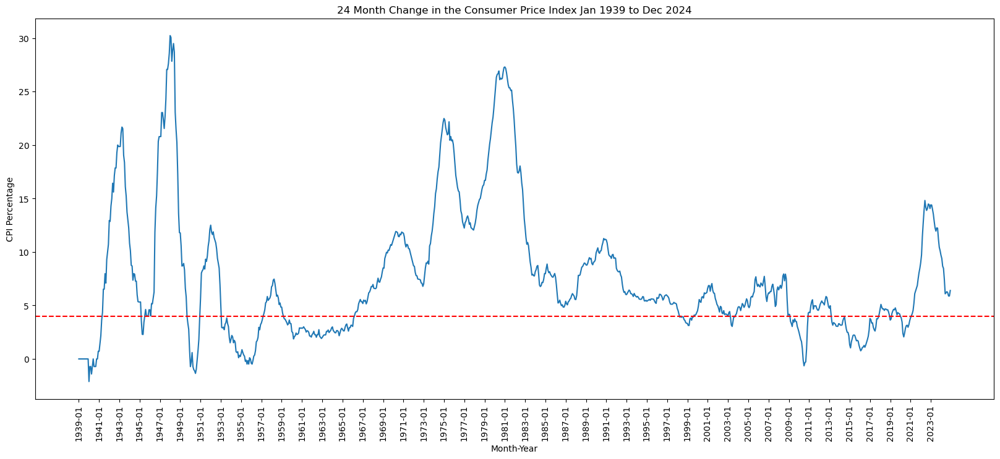

In [113]:
plt.figure(figsize=(20, 8))
plt.plot(df.iloc[:, 0], df.iloc[:, 46])
plt.axhline(y=4, color='r', linestyle='--')
plt.xticks(range(0, len(df), 24))
plt.xticks(rotation=90)

plt.title("24 Month Change in the Consumer Price Index Jan 1939 to Dec 2024")

plt.xlabel("Month-Year")
plt.ylabel("CPI Percentage")
plt.show()



In [114]:
#At this point it makes sense to build a new datafram made up of our data that is based on the prior 24 months as well as monthly data
#We will combine our values generated from 24 months of data: Columns 38, 39, 40, 41, 43, 45, 46

df_24M = df.iloc[24:, [0, 9, 22, 38, 39, 40, 41, 43, 45, 46, 49, 50, 4, 3, 66, 67, 68]].copy()



In [117]:
df_12M = df.iloc[12:, [0, 9, 22, 51, 53, 59, 61, 63, 45, 46, 49, 50, 4, 3, 66, 67, 68]].copy() 

In [119]:
df_42M = df.iloc[42:, [0, 9, 22, 52, 54, 60, 62, 64, 45, 46, 49, 50, 4, 3, 66, 67, 68]].copy()

In [121]:
df_24M.head()

,Date,Consumer Price Index Change (No factors removed) - As a Number not a percentage (Source: U.S. Bureau of Labor Statistics),GDP per capita,"38. 24 month difference in All Employees, Total Nonfarm per capita",39. 24 month change of (New Durable goods orders per capita: GDP per capita),40. 24 Month Change in residential building permits per capita,41. 24 Month Change in debt held by the public Per captia: GDP per captia,43. 24 Month Change in Debt Held by the Government per capita: GDP per capita,45. 24 Month moving Average of the Federal Funds Rate,46. 24 month compounded inflation as a Percentage,49. 24 Month Percent Change in GDP per capita,50. 12 Month Percent Change in GDP per capita,Federal Funds Rate on the First of the Month (Source: 1954-7-1 - 2025-1-1 Federal Reserve Bank of New York; 1939-1-1 - 1954-6-1 Wall Street Journal ),"Recession (Yes = 1,000 and No = 0) With adjustments for date verification",66. Total of (National Debt and Debt Held by the public):GDP,67. Total of National Debt:GDP,68. Total of Debt Held by the Public:GDP
24,1941-01,1.438849,792.636853,0.031125,NaN,0.0,0.025026,0.0,0.25,0.714286,17.661503,10.505530,0.25,NaN,0.411928,0.0,0.411928
25,1941-02,0.714286,806.960749,0.032342,NaN,0.0,0.019618,0.0,0.25,1.438849,19.187167,11.667108,0.25,NaN,0.408220,0.0,0.408220
26,1941-03,1.428571,821.543496,0.032679,NaN,0.0,0.014236,0.0,0.25,2.158273,20.732614,12.840895,0.25,NaN,0.404546,0.0,0.404546
27,1941-04,2.142857,836.389770,0.036773,NaN,0.0,0.008880,0.0,0.25,3.623188,22.298100,14.027020,0.25,NaN,0.400904,0.0,0.400904
28,1941-05,2.857143,851.504334,0.040410,NaN,0.0,0.003548,0.0,0.25,4.347826,23.883885,15.225613,0.25,NaN,0.397296,0.0,0.397296


In [123]:
from IPython.display import display, HTML

#Code Create's a Table that can be scrolled through
html_table = df_24M.to_html(classes='table table-bordered table-striped table-condensed', escape=False)
display(HTML(f'<div style="height: 1000px; overflow: auto;">{html_table}</div>'))

#We keep the command of adding a column number inactive to aviod repeatedly appending columns numbers e.g. 1.1.1, 2.2.2.
#df_24M.columns = [f'{i}. {col}' for i, col in enumerate(df.columns)]

#df.iloc[0:1026, 17] = df.iloc[0:1026, 17].astype(float)

with pd.option_context('display.max_rows', None,   
                       'display.max_columns', None,  
                       'display.width', 1000,        
                       'display.max_colwidth', None): 
    df_24M

,Date,Consumer Price Index Change (No factors removed) - As a Number not a percentage (Source: U.S. Bureau of Labor Statistics),GDP per capita,"38. 24 month difference in All Employees, Total Nonfarm per capita",39. 24 month change of (New Durable goods orders per capita: GDP per capita),40. 24 Month Change in residential building permits per capita,41. 24 Month Change in debt held by the public Per captia: GDP per captia,43. 24 Month Change in Debt Held by the Government per capita: GDP per capita,45. 24 Month moving Average of the Federal Funds Rate,46. 24 month compounded inflation as a Percentage,49. 24 Month Percent Change in GDP per capita,50. 12 Month Percent Change in GDP per capita,Federal Funds Rate on the First of the Month (Source: 1954-7-1 - 2025-1-1 Federal Reserve Bank of New York; 1939-1-1 - 1954-6-1 Wall Street Journal ),"Recession (Yes = 1,000 and No = 0) With adjustments for date verification",66. Total of (National Debt and Debt Held by the public):GDP,67. Total of National Debt:GDP,68. Total of Debt Held by the Public:GDP
24,1941-01,1.438849,792.636853,0.031125,NaN,0.000000e+00,0.025026,0.000000,0.250000,7.142857e-01,17.661503,10.505530,0.25000,NaN,0.411928,0.000000,0.411928
25,1941-02,0.714286,806.960749,0.032342,NaN,0.000000e+00,0.019618,0.000000,0.250000,1.438849e+00,19.187167,11.667108,0.25000,NaN,0.408220,0.000000,0.408220
26,1941-03,1.428571,821.543496,0.032679,NaN,0.000000e+00,0.014236,0.000000,0.250000,2.158273e+00,20.732614,12.840895,0.25000,NaN,0.404546,0.000000,0.404546
27,1941-04,2.142857,836.389770,0.036773,NaN,0.000000e+00,0.008880,0.000000,0.250000,3.623188e+00,22.298100,14.027020,0.25000,NaN,0.400904,0.000000,0.400904
28,1941-05,2.857143,851.504334,0.040410,NaN,0.000000e+00,0.003548,0.000000,0.250000,4.347826e+00,23.883885,15.225613,0.25000,NaN,0.397296,0.000000,0.397296
29,1941-06,4.255319,866.892036,0.042203,NaN,0.000000e+00,-0.001758,0.000000,0.250000,6.521739e+00,25.490233,16.436806,0.25000,NaN,0.393720,0.000000,0.393720
30,1941-07,5.000000,882.557812,0.046319,NaN,0.000000e+00,-0.007040,0.000000,0.250000,6.521739e+00,27.117409,17.660729,0.25000,NaN,0.390176,0.000000,0.390176
31,1941-08,6.428571,898.506688,0.047329,NaN,0.000000e+00,-0.012297,0.000000,0.250000,7.971014e+00,28.765684,18.897518,0.25000,NaN,0.386663,0.000000,0.386663
32,1941-09,7.857143,914.743779,0.046519,NaN,0.000000e+00,-0.017530,0.000000,0.250000,7.092199e+00,30.435331,20.147308,0.25000,NaN,0.383183,0.000000,0.383183
33,1941-10,9.285714,931.274294,0.044292,NaN,0.000000e+00,-0.022740,0.000000,0.250000,9.285714e+00,32.126628,21.410235,0.25000,NaN,0.379734,0.000000,0.379734


In [125]:
df_24M.head()

,Date,Consumer Price Index Change (No factors removed) - As a Number not a percentage (Source: U.S. Bureau of Labor Statistics),GDP per capita,"38. 24 month difference in All Employees, Total Nonfarm per capita",39. 24 month change of (New Durable goods orders per capita: GDP per capita),40. 24 Month Change in residential building permits per capita,41. 24 Month Change in debt held by the public Per captia: GDP per captia,43. 24 Month Change in Debt Held by the Government per capita: GDP per capita,45. 24 Month moving Average of the Federal Funds Rate,46. 24 month compounded inflation as a Percentage,49. 24 Month Percent Change in GDP per capita,50. 12 Month Percent Change in GDP per capita,Federal Funds Rate on the First of the Month (Source: 1954-7-1 - 2025-1-1 Federal Reserve Bank of New York; 1939-1-1 - 1954-6-1 Wall Street Journal ),"Recession (Yes = 1,000 and No = 0) With adjustments for date verification",66. Total of (National Debt and Debt Held by the public):GDP,67. Total of National Debt:GDP,68. Total of Debt Held by the Public:GDP
24,1941-01,1.438849,792.636853,0.031125,NaN,0.0,0.025026,0.0,0.25,0.714286,17.661503,10.505530,0.25,NaN,0.411928,0.0,0.411928
25,1941-02,0.714286,806.960749,0.032342,NaN,0.0,0.019618,0.0,0.25,1.438849,19.187167,11.667108,0.25,NaN,0.408220,0.0,0.408220
26,1941-03,1.428571,821.543496,0.032679,NaN,0.0,0.014236,0.0,0.25,2.158273,20.732614,12.840895,0.25,NaN,0.404546,0.0,0.404546
27,1941-04,2.142857,836.389770,0.036773,NaN,0.0,0.008880,0.0,0.25,3.623188,22.298100,14.027020,0.25,NaN,0.400904,0.0,0.400904
28,1941-05,2.857143,851.504334,0.040410,NaN,0.0,0.003548,0.0,0.25,4.347826,23.883885,15.225613,0.25,NaN,0.397296,0.0,0.397296


In [127]:
#Count (using `.sum()`) the number of missing values (`.isnull()`) in each column of 
#ski_data as well as the percentages (using `.mean()` instead of `.sum()`).
#Order them (increasing or decreasing) using sort_values
#Call `pd.concat` to present these in a single table (DataFrame) with the helpful column names 'count' and '%'
missing = pd.concat([df_24M.isnull().sum(), 100 * df_24M.isnull().mean()], axis=1)
missing.columns=['count', '%']
missing = missing.sort_values(by='count', ascending=False)

print(missing)

                                                    count          %
Recession (Yes = 1,000 and No = 0) With adjustm...    863  85.615079
39. 24 month change of (New Durable goods order...    615  61.011905
40. 24 Month Change in residential building per...      3   0.297619
Date                                                    0   0.000000
49. 24 Month Percent Change in GDP per capita           0   0.000000
67. Total of National Debt:GDP                          0   0.000000
66. Total of (National Debt and Debt Held by th...      0   0.000000
Federal Funds Rate on the First of the Month (S...      0   0.000000
50. 12 Month Percent Change in GDP per capita           0   0.000000
45. 24 Month moving Average of the Federal Fund...      0   0.000000
46. 24 month compounded inflation as a Percentage       0   0.000000
 Consumer Price Index Change (No factors remove...      0   0.000000
43. 24 Month Change in Debt Held by the Governm...      0   0.000000
41. 24 Month Change in debt held b

In [129]:
nan_locations = df_24M.isna()
nan_positions = np.where(nan_locations)

nan_positions_list = list(zip(nan_positions[0], nan_positions[1]))
print("NaN positions (row, column):", nan_positions_list)

NaN positions (row, column): [(0, 4), (0, 13), (1, 4), (1, 13), (2, 4), (2, 13), (3, 4), (3, 13), (4, 4), (4, 13), (5, 4), (5, 13), (6, 4), (6, 13), (7, 4), (7, 13), (8, 4), (8, 13), (9, 4), (9, 13), (10, 4), (10, 13), (11, 4), (11, 13), (12, 4), (12, 13), (13, 4), (13, 13), (14, 4), (14, 13), (15, 4), (15, 13), (16, 4), (16, 13), (17, 4), (17, 13), (18, 4), (18, 13), (19, 4), (19, 13), (20, 4), (20, 13), (21, 4), (21, 13), (22, 4), (22, 13), (23, 4), (23, 13), (24, 4), (24, 13), (25, 4), (25, 13), (26, 4), (26, 13), (27, 4), (27, 13), (28, 4), (28, 13), (29, 4), (29, 13), (30, 4), (30, 13), (31, 4), (31, 13), (32, 4), (32, 13), (33, 4), (33, 13), (34, 4), (34, 13), (35, 4), (35, 13), (36, 4), (36, 13), (37, 4), (37, 13), (38, 4), (38, 13), (39, 4), (39, 13), (40, 4), (40, 13), (41, 4), (41, 13), (42, 4), (42, 13), (43, 4), (43, 13), (44, 4), (44, 13), (45, 4), (45, 13), (46, 4), (46, 13), (47, 4), (47, 13), (48, 4), (48, 13), (49, 4), (50, 4), (51, 4), (52, 4), (53, 4), (54, 4), (55, 

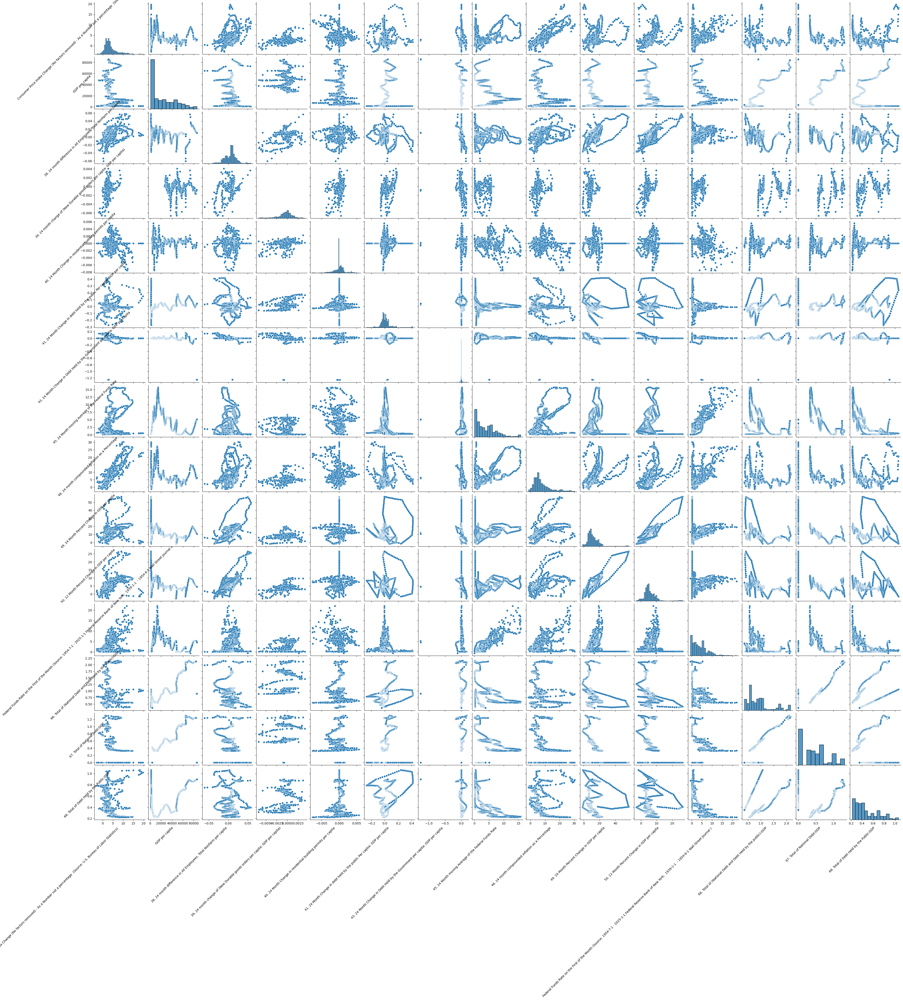

In [131]:
pairplot = sns.pairplot(df_24M)

for ax in pairplot.axes.flatten():
    ax.set_xlabel(ax.get_xlabel(), rotation=45, ha='right')
    ax.set_ylabel(ax.get_ylabel(), rotation=45, va='top')

plt.show()


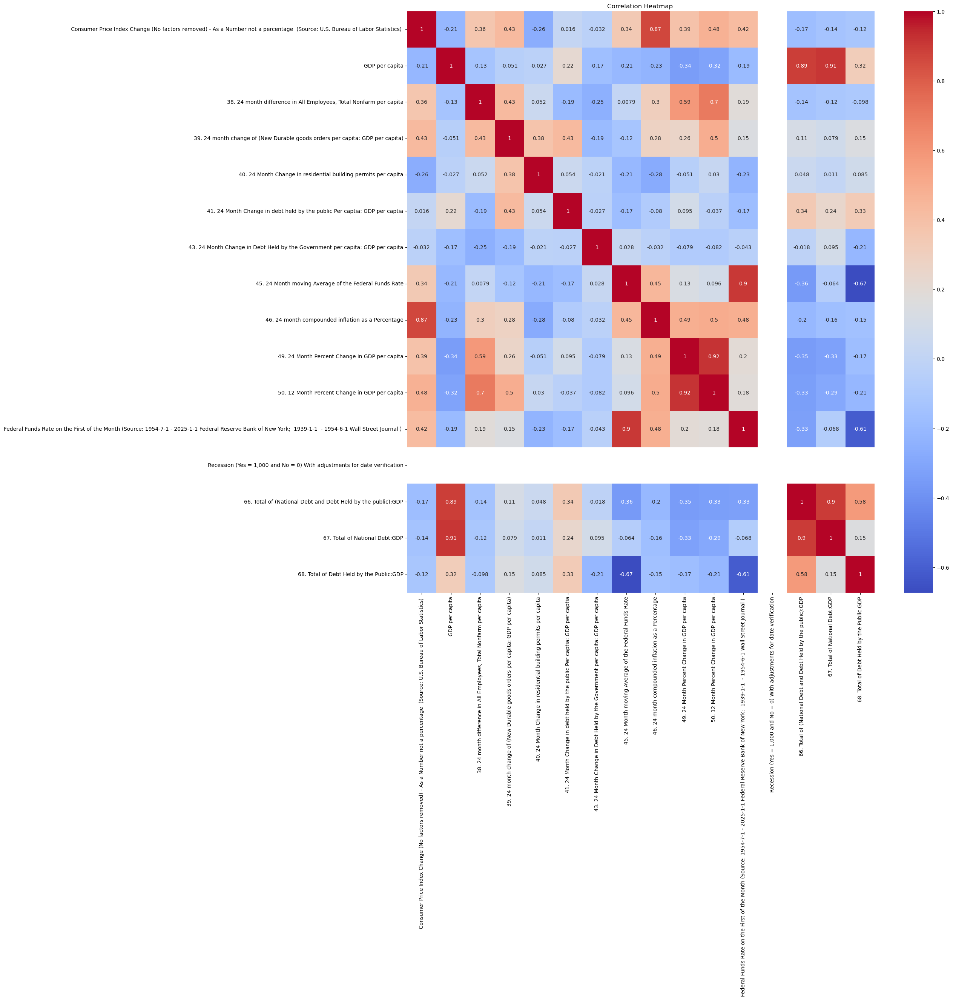

In [132]:
#Lets take a look at a correlation heatmap
#There are a lot of varaibles that we expected to see a stronger correlation Although this may be due to a delay between one even and another and 
#staggering the data with respect to time might uncover stronger correlations.

import seaborn as sns

# Correlation Heatmap across all variables

df_24M_drop_C0 = df_24M.drop(df_24M.columns[0], axis=1)


correlation_matrix = df_24M_drop_C0.corr()

plt.figure(figsize=(20, 20))  
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

plt.title('Correlation Heatmap ')
plt.show()



In [133]:
from IPython.display import display, HTML

#Code Create's a Table that can be scrolled through
html_table = df_24M.to_html(classes='table table-bordered table-striped table-condensed', escape=False)
display(HTML(f'<div style="height: 1000px; overflow: auto;">{html_table}</div>'))

#We keep the command of adding a column number inactive to aviod repeatedly appending columns numbers e.g. 1.1.1, 2.2.2.
#df_24M.columns = [f'{i}. {col}' for i, col in enumerate(df_24M.columns)]

#df.iloc[0:1026, 17] = df.iloc[0:1026, 17].astype(float)

with pd.option_context('display.max_rows', None,   
                       'display.max_columns', None,  
                       'display.width', 1000,        
                       'display.max_colwidth', None): 
    df_24M

,Date,Consumer Price Index Change (No factors removed) - As a Number not a percentage (Source: U.S. Bureau of Labor Statistics),GDP per capita,"38. 24 month difference in All Employees, Total Nonfarm per capita",39. 24 month change of (New Durable goods orders per capita: GDP per capita),40. 24 Month Change in residential building permits per capita,41. 24 Month Change in debt held by the public Per captia: GDP per captia,43. 24 Month Change in Debt Held by the Government per capita: GDP per capita,45. 24 Month moving Average of the Federal Funds Rate,46. 24 month compounded inflation as a Percentage,49. 24 Month Percent Change in GDP per capita,50. 12 Month Percent Change in GDP per capita,Federal Funds Rate on the First of the Month (Source: 1954-7-1 - 2025-1-1 Federal Reserve Bank of New York; 1939-1-1 - 1954-6-1 Wall Street Journal ),"Recession (Yes = 1,000 and No = 0) With adjustments for date verification",66. Total of (National Debt and Debt Held by the public):GDP,67. Total of National Debt:GDP,68. Total of Debt Held by the Public:GDP
24,1941-01,1.438849,792.636853,0.031125,NaN,0.000000e+00,0.025026,0.000000,0.250000,7.142857e-01,17.661503,10.505530,0.25000,NaN,0.411928,0.000000,0.411928
25,1941-02,0.714286,806.960749,0.032342,NaN,0.000000e+00,0.019618,0.000000,0.250000,1.438849e+00,19.187167,11.667108,0.25000,NaN,0.408220,0.000000,0.408220
26,1941-03,1.428571,821.543496,0.032679,NaN,0.000000e+00,0.014236,0.000000,0.250000,2.158273e+00,20.732614,12.840895,0.25000,NaN,0.404546,0.000000,0.404546
27,1941-04,2.142857,836.389770,0.036773,NaN,0.000000e+00,0.008880,0.000000,0.250000,3.623188e+00,22.298100,14.027020,0.25000,NaN,0.400904,0.000000,0.400904
28,1941-05,2.857143,851.504334,0.040410,NaN,0.000000e+00,0.003548,0.000000,0.250000,4.347826e+00,23.883885,15.225613,0.25000,NaN,0.397296,0.000000,0.397296
29,1941-06,4.255319,866.892036,0.042203,NaN,0.000000e+00,-0.001758,0.000000,0.250000,6.521739e+00,25.490233,16.436806,0.25000,NaN,0.393720,0.000000,0.393720
30,1941-07,5.000000,882.557812,0.046319,NaN,0.000000e+00,-0.007040,0.000000,0.250000,6.521739e+00,27.117409,17.660729,0.25000,NaN,0.390176,0.000000,0.390176
31,1941-08,6.428571,898.506688,0.047329,NaN,0.000000e+00,-0.012297,0.000000,0.250000,7.971014e+00,28.765684,18.897518,0.25000,NaN,0.386663,0.000000,0.386663
32,1941-09,7.857143,914.743779,0.046519,NaN,0.000000e+00,-0.017530,0.000000,0.250000,7.092199e+00,30.435331,20.147308,0.25000,NaN,0.383183,0.000000,0.383183
33,1941-10,9.285714,931.274294,0.044292,NaN,0.000000e+00,-0.022740,0.000000,0.250000,9.285714e+00,32.126628,21.410235,0.25000,NaN,0.379734,0.000000,0.379734


In [134]:
df_24M.iloc[:, 13] = df_24M.iloc[:, 13].fillna(0)
df_24M.iloc[:, 13] = df_24M.iloc[:, 13].astype(int)

df_12M.iloc[:, 13] = df_12M.iloc[:, 13].fillna(0)
df_12M.iloc[:, 13] = df_12M.iloc[:, 13].astype(int)

df_12M.iloc[:, 13] = df_12M.iloc[:, 13].fillna(0)
df_12M.iloc[:, 13] = df_12M.iloc[:, 13].astype(int)


/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/4132195441.py:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_12M.iloc[:, 13] = df_12M.iloc[:, 13].fillna(0)


Text(0.5, 1.0, 'Plot of 24 month inflation and 24 Month change in Total Nonfarm payroll per capita (Recession shown as gray bars)')

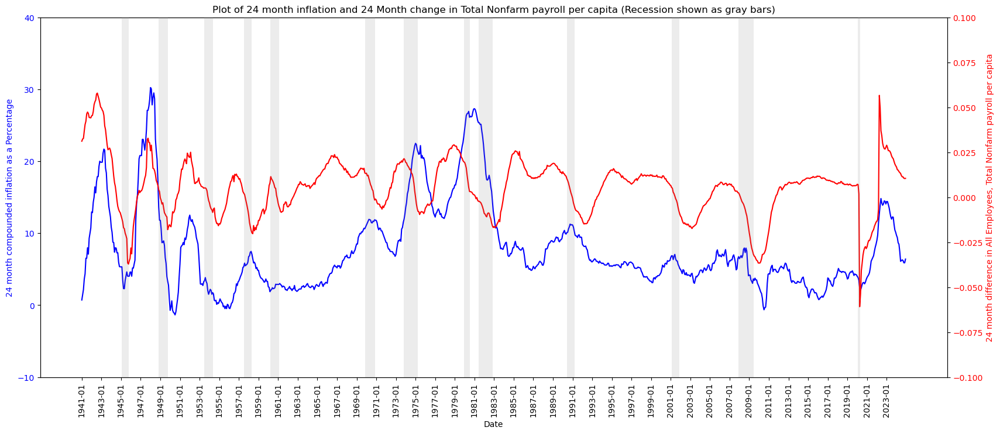

In [135]:
fig, ax1 = plt.subplots(figsize=(20, 8))

#Lets take a look at different line plots
ax1.plot(df_24M.iloc[:, 0], df_24M.iloc[:, 9], color='blue', label='A')
ax1.set_xlabel('Date')
ax1.set_ylabel('24 month compounded inflation as a Percentage', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim([-10, 40])

ax2 = ax1.twinx()

ax2.plot(df_24M.iloc[:, 0], df_24M.iloc[:, 3], color='red', label='B')
ax2.set_ylabel('24 month difference in All Employees, Total Nonfarm payroll per capita', color='red')
ax2.tick_params(axis='y', labelcolor='red')
plt.xticks(range(0, len(df_24M), 24))
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
ax2.set_ylim([-.10, .10])

ax5 = ax1.twinx()
ax5.bar(df_24M.iloc[:, 0], df_24M.iloc[:, 13], width=1, color='gray', alpha=0.15)
ax5.set_ylim([10, 100])
ax5.axis('off')

plt.title("Plot of 24 month inflation and 24 Month change in Total Nonfarm payroll per capita (Recession shown as gray bars)")

Text(0.5, 1.0, 'Plot of 24 month inflation and 24 Month change in Residential Building Permits per capita')

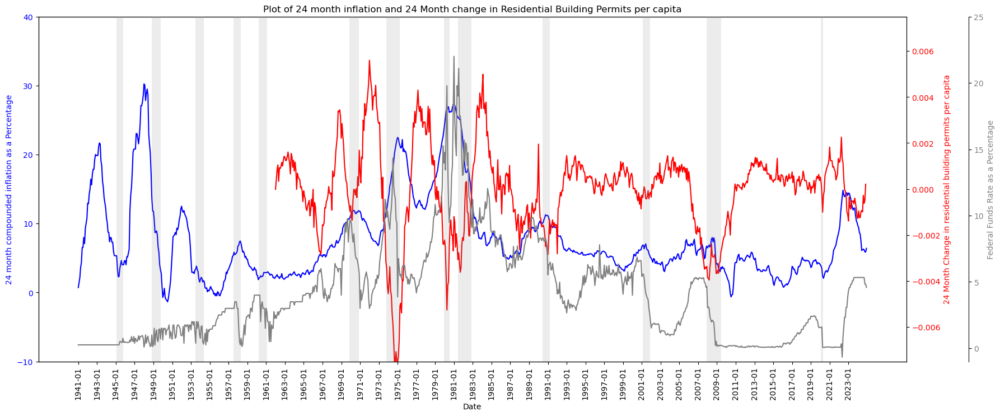

In [136]:
fig, ax1 = plt.subplots(figsize=(20, 8))

#Lets take a look at different line plots
ax1.plot(df_24M.iloc[:, 0], df_24M.iloc[:, 9], color='blue', label='A')
ax1.set_xlabel('Date')
ax1.set_ylabel('24 month compounded inflation as a Percentage', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim([-10, 40])

ax2 = ax1.twinx()

ax2.plot(df_24M.iloc[250:, 0], df_24M.iloc[250:, 5], color='red', label='B')
ax2.set_ylabel('24 Month Change in residential building permits per capita', color='red')
ax2.tick_params(axis='y', labelcolor='red')
plt.xticks(range(0, len(df_24M), 24))
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
ax2.set_ylim([-.0075, .0075])


ax4 = ax1.twinx()
ax4.spines['right'].set_position(('outward', 80)) 
ax4.yaxis.set_ticks_position('right')  
ax4.yaxis.set_label_position('right')
ax4.plot(df_24M.iloc[:, 0], df_24M.iloc[:, 12], color='gray')
ax4.set_ylabel('Federal Funds Rate as a Percentage', color='gray')
ax4.tick_params(axis='y', labelcolor='gray')

ax4.set_ylim([-1, 25])

ax5 = ax1.twinx()
ax5.bar(df_24M.iloc[:, 0], df_24M.iloc[:, 13], width=1, color='gray', alpha=0.15)
ax5.set_ylim([10, 100])
ax5.axis('off')

plt.title("Plot of 24 month inflation and 24 Month change in Residential Building Permits per capita")

In [137]:
#Comment

Text(0.5, 1.0, 'Plot of 24 month inflation and 24 Month change in Durable Goods orders per capita : GDP per capita')

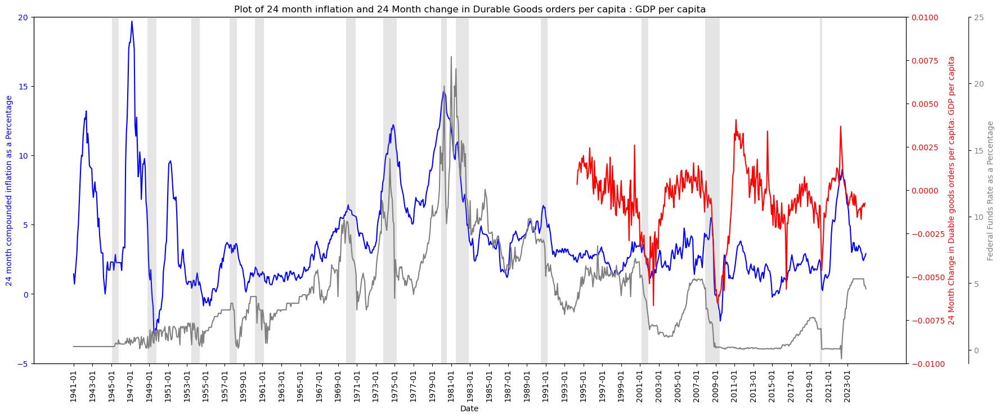

In [138]:
fig, ax1 = plt.subplots(figsize=(20, 8))

#Lets take a look at different line plots
ax1.plot(df_24M.iloc[:, 0], df_24M.iloc[:, 1], color='blue', label='A')
ax1.set_xlabel('Date')
ax1.set_ylabel('24 month compounded inflation as a Percentage', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim([-5, 20])

ax2 = ax1.twinx()

ax2.plot(df_24M.iloc[640:, 0], df_24M.iloc[640:, 4], color='red', label='B')
ax2.set_ylabel('24 Month Change in Duable goods orders per capita: GDP per capita', color='red')
ax2.tick_params(axis='y', labelcolor='red')
plt.xticks(range(0, len(df_24M), 24))
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
ax2.set_ylim([-.01, .01])


ax4 = ax1.twinx()
ax4.spines['right'].set_position(('outward', 80)) 
ax4.yaxis.set_ticks_position('right')  
ax4.yaxis.set_label_position('right')
ax4.plot(df_24M.iloc[:, 0], df_24M.iloc[:, 12], color='gray')
ax4.set_ylabel('Federal Funds Rate as a Percentage', color='gray')
ax4.tick_params(axis='y', labelcolor='gray')


ax4.set_ylim([-1, 25])

ax5 = ax1.twinx()
ax5.bar(df_24M.iloc[:, 0], df_24M.iloc[:, 13], width=1, color='gray', alpha=0.2)
ax5.set_ylim([10, 100])
ax5.axis('off')

plt.title("Plot of 24 month inflation and 24 Month change in Durable Goods orders per capita : GDP per capita")

Text(0.5, 1.0, 'Plot of 24 month inflation and 24 Month Change in debt held by the public Per captia: GDP per captia')

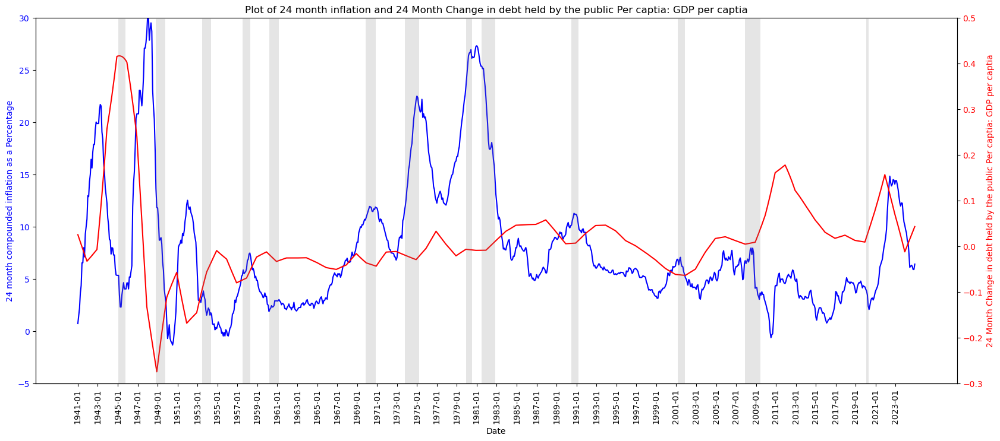

In [139]:
fig, ax1 = plt.subplots(figsize=(20, 8))

#Lets take a look at different line plots
ax1.plot(df_24M.iloc[:, 0], df_24M.iloc[:, 9], color='blue', label='A')
ax1.set_xlabel('Date')
ax1.set_ylabel('24 month compounded inflation as a Percentage', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim([-5, 30])

ax2 = ax1.twinx()

ax2.plot(df_24M.iloc[:, 0], df_24M.iloc[:, 6], color='red', label='B')
ax2.set_ylabel('24 Month Change in debt held by the public Per captia: GDP per captia', color='red')
ax2.tick_params(axis='y', labelcolor='red')
plt.xticks(range(0, len(df_24M), 24))
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
ax2.set_ylim([-.3, .5])

ax5 = ax1.twinx()
ax5.bar(df_24M.iloc[:, 0], df_24M.iloc[:, 13], width=1, color='gray', alpha=0.2)
ax5.set_ylim([10, 100])
ax5.axis('off')

plt.title("Plot of 24 month inflation and 24 Month Change in debt held by the public Per captia: GDP per captia")



Text(0.5, 1.0, 'Plot of 24 month inflation and 24 Month Change in debt held by the Government Per captia: GDP per captia')

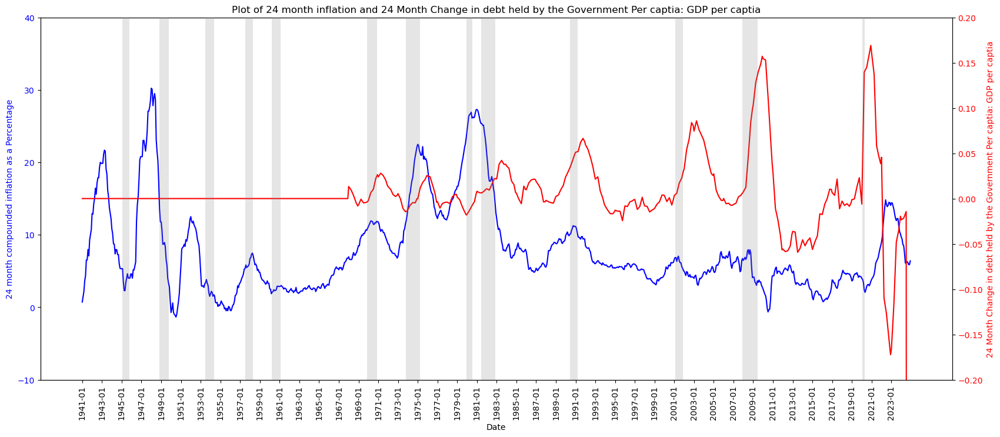

In [140]:
fig, ax1 = plt.subplots(figsize=(20, 8))


ax1.plot(df_24M.iloc[:, 0], df_24M.iloc[:, 9], color='blue', label='A')
ax1.set_xlabel('Date')
ax1.set_ylabel('24 month compounded inflation as a Percentage', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim([-10, 40])


ax2 = ax1.twinx()


ax2.plot(df_24M.iloc[:, 0], df_24M.iloc[:, 7], color='red', label='B')
ax2.set_ylabel('24 Month Change in debt held by the Government Per captia: GDP per captia', color='red')
ax2.tick_params(axis='y', labelcolor='red')
plt.xticks(range(0, len(df_24M), 24))
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
ax2.set_ylim([-.2, .2])

ax5 = ax1.twinx()
ax5.bar(df_24M.iloc[:, 0], df_24M.iloc[:, 13], width=1, color='gray', alpha=0.2)
ax5.set_ylim([10, 100])
ax5.axis('off')

plt.title("Plot of 24 month inflation and 24 Month Change in debt held by the Government Per captia: GDP per captia")



Text(0.5, 1.0, 'Plot of 24 month inflation and 24 Month Change in Total National debt per captia: GDP per captia')

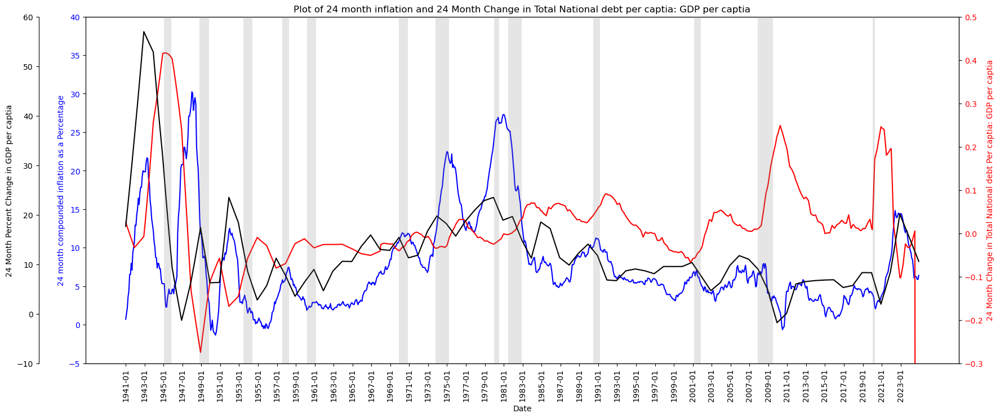

In [141]:
fig, ax1 = plt.subplots(figsize=(20, 8))

#Lets take a look at different line plots
ax1.plot(df_24M.iloc[:, 0], df_24M.iloc[:, 9], color='blue', label='A')
ax1.set_xlabel('Date')
ax1.set_ylabel('24 month compounded inflation as a Percentage', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim([-5, 40])


ax2 = ax1.twinx()


ax2.plot(df_24M.iloc[:, 0], df_24M.iloc[:, 6] + df_24M.iloc[:, 7] , color='red', label='B')
ax2.set_ylabel('24 Month Change in Total National debt Per captia: GDP per captia', color='red')
ax2.tick_params(axis='y', labelcolor='red')
plt.xticks(range(0, len(df_24M), 24))
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
ax2.set_ylim([-.3, .5])


ax3 = ax1.twinx()
ax3.spines['left'].set_position(('outward', 60)) 
ax3.yaxis.set_ticks_position('left')  
ax3.yaxis.set_label_position('left')

ax3.plot(df_24M.iloc[:, 0], df_24M.iloc[:, 10], color='black')
ax3.set_ylabel('24 Month Percent Change in GDP per captia', color='black')
ax3.tick_params(axis='y', labelcolor='black')

ax3.set_ylim([-10, 60])

ax5 = ax1.twinx()
ax5.bar(df_24M.iloc[:, 0], df_24M.iloc[:, 13], width=1, color='gray', alpha=0.2)
ax5.set_ylim([10, 100])
ax5.axis('off')

plt.title("Plot of 24 month inflation and 24 Month Change in Total National debt per captia: GDP per captia")



Text(0.5, 1.0, 'Plot of 24 month inflation and 24 Month Change in Total National debt per captia: GDP per captia and 24 Month percent cahnge in GDP per capita')

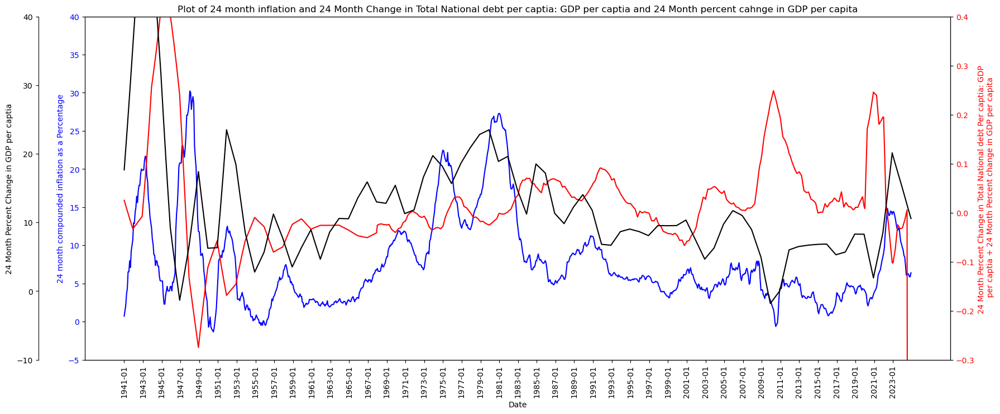

In [142]:
fig, ax1 = plt.subplots(figsize=(20, 8))

#Lets take a look at different line plots
ax1.plot(df_24M.iloc[:, 0], df_24M.iloc[:, 9], color='blue', label='A')
ax1.set_xlabel('Date')
ax1.set_ylabel('24 month compounded inflation as a Percentage', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim([-5, 40])

ax2 = ax1.twinx()

ax2.plot(df_24M.iloc[:, 0], df_24M.iloc[:, 6] + df_24M.iloc[:, 7] , color='red', label='B')
ax2.set_ylabel('24 Month Percent Change in Total National debt Per captia: GDP \n per captia + 24 Month Percent change in GDP per capita', color='red')
ax2.tick_params(axis='y', labelcolor='red')
plt.xticks(range(0, len(df_24M), 24))
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
ax2.set_ylim([-.3, .4])

ax3 = ax1.twinx()
ax3.spines['left'].set_position(('outward', 60)) 
ax3.yaxis.set_ticks_position('left')  
ax3.yaxis.set_label_position('left')

ax3.plot(df_24M.iloc[:, 0], df_24M.iloc[:, 10], color='black')
ax3.set_ylabel('24 Month Percent Change in GDP per captia', color='black')
ax3.tick_params(axis='y', labelcolor='black')

ax3.set_ylim([-10, 40])


plt.title("Plot of 24 month inflation and 24 Month Change in Total National debt per captia: GDP per captia and 24 Month percent cahnge in GDP per capita")

Text(0.5, 1.0, 'Plot of 24 month inflation and combined (24 Month Percent Change in Total National debt Per captia: GDP per captia + 24 Month Percent change in GDP per capita)')

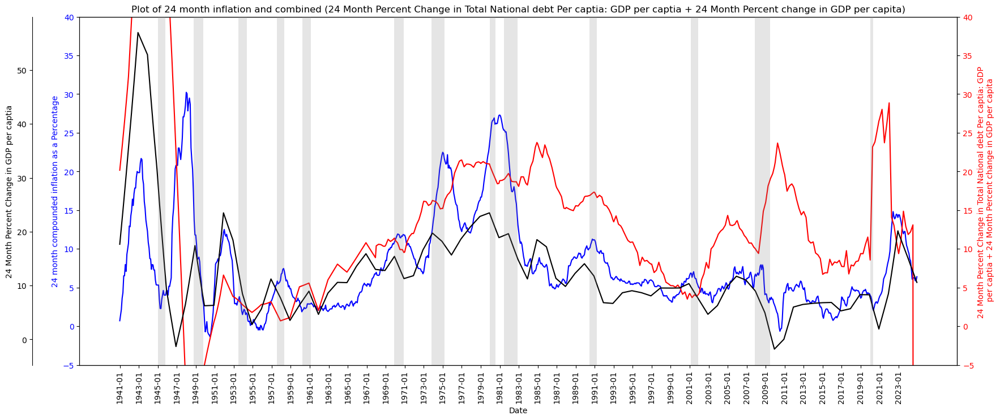

In [143]:
fig, ax1 = plt.subplots(figsize=(20, 8))

#Lets take a look at different line plots
ax1.plot(df_24M.iloc[:, 0], df_24M.iloc[:, 9], color='blue', label='A')
ax1.set_xlabel('Date')
ax1.set_ylabel('24 month compounded inflation as a Percentage', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim([-5, 40])

ax2 = ax1.twinx()

ax2.plot(df_24M.iloc[:, 0], (df_24M.iloc[:, 6] + df_24M.iloc[:, 7])*100 + df_24M.iloc[:, 10], color='red', label='B')
ax2.set_ylabel('24 Month Percent Change in Total National debt Per captia: GDP \n per captia + 24 Month Percent change in GDP per capita', color='red')
ax2.tick_params(axis='y', labelcolor='red')
plt.xticks(range(0, len(df_24M), 24))
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
ax2.set_ylim([-5, 40])

ax3 = ax1.twinx()
ax3.spines['left'].set_position(('outward', 60)) 
ax3.yaxis.set_ticks_position('left')  
ax3.yaxis.set_label_position('left')

ax3.plot(df_24M.iloc[:, 0], df_24M.iloc[:, 10], color='black')
ax3.set_ylabel('24 Month Percent Change in GDP per captia', color='black')
ax3.tick_params(axis='y', labelcolor='black')


ax5 = ax1.twinx()
ax5.bar(df_24M.iloc[:, 0], df_24M.iloc[:, 13], width=1, color='gray', alpha=0.2)
ax5.set_ylim([10, 100])
ax5.axis('off')


plt.title("Plot of 24 month inflation and combined (24 Month Percent Change in Total National debt Per captia: GDP per captia + 24 Month Percent change in GDP per capita)")

In [144]:
#This seems to model inflation suggesting we see inflation when debt is issued or the average wage increases. 

In [145]:
y = df_24M.iloc[150:, 9]  
x = ((df_24M.iloc[150:, 6] + df_24M.iloc[150:, 7]) * 100 + df_24M.iloc[150:, 10]).values  

plt.figure(figsize=(8, 6))
valid_data = ~np.isnan(x) & ~np.isnan(y)  
x_clean = x[valid_data]  
y_clean = y[valid_data] 

model = LinearRegression()

model.fit(x_clean.reshape(-1, 1), y_clean)  

slope = model.coef_[0]
intercept = model.intercept_

regression_line = model.predict(x_clean.reshape(-1, 1))


plt.plot(x_clean, regression_line, color='red', label='Regression Line')
plt.scatter(x_clean, y_clean, color='blue', label='Data')

plt.ylim(-2, 30)
plt.xlim(-2, 30)

plt.title('Scatter Plot with Regression Line Between 24 month compounded inflation \n and combined (24 Month Change in Total National debt Per captia: GDP\n per captia as a percent + 24 Month Percent change in GDP per capita)')


NameError: name 'LinearRegression' is not defined

<Figure size 800x600 with 0 Axes>

In [ ]:

y = df_24M.iloc[:, 9].values  
x = (df_24M.iloc[:, 6] + df_24M.iloc[:, 7]) * 100 + df_24M.iloc[:, 10]  


def cross_correlation_positive_lags(x, y, max_lag=20):
    correlation = []
    for lag in range(1, max_lag + 1): 
        x_lagged = x[:-lag]
        y_lagged = y[lag:]
        correlation.append(np.corrcoef(x_lagged, y_lagged)[0, 1])
    return correlation


lags = range(1, 21)  
correlation = cross_correlation_positive_lags(x, y, max_lag=20)

plt.figure(figsize=(8, 6))
plt.plot(lags, correlation)
plt.title('Cross-Correlation Between combined (24 Month Change in Total National \ndebt Per captia: GDP per captia as a percent + 24 Month Percent change\n in GDP per capita) and 24 month compounded inflation (Only Positive Lags)')
plt.xlabel('Lag')
plt.ylabel('Correlation')
plt.show()
ax.set_xlim([0, 25])  
ax.set_ylim([-1, 1])


print(f"Correlation values: {correlation}")

In [ ]:
#Just to get an ideal of the correlation of the two values above with no lag
#Lets also double check our work above 
y = df_24M.iloc[:, 9]
x = (df_24M.iloc[:, 6] + df_24M.iloc[:, 7]) * 100 + df_24M.iloc[:, 10]  

correlation = x.corr(y)
print(correlation)

y2 = df_24M.iloc[:, 9].shift(-20)
x2 = (df_24M.iloc[:, 6] + df_24M.iloc[:, 7]) * 100 + df_24M.iloc[:, 10]  

correlation = x2.corr(y2)
print(correlation)

In [ ]:
y = df_24M.iloc[:, 1].values  
x = (df_24M.iloc[:, 6] + df_24M.iloc[:, 7]) * 100 + df_24M.iloc[:, 10]


def cross_correlation_positive_lags(x, y, max_lag=20):
    correlation = []
    for lag in range(1, max_lag + 1): 
        x_lagged = x[:-lag]
        y_lagged = y[lag:]
        correlation.append(np.corrcoef(x_lagged, y_lagged)[0, 1])
    return correlation


lags = range(1, 21)  
correlation = cross_correlation_positive_lags(x, y, max_lag=20)
plt.figure(figsize=(7, 7))
plt.plot(lags, correlation)
plt.title('Cross-Correlation Between combined (24 Month Change in Total \n National debt Per captia: GDP per captia as a percent + 24 Month\n Percent change in GDP per capita) and Consumer Price Index (Only Positive Lags)')
plt.xlabel('Lag')
plt.ylabel('Correlation')
plt.show()
ax.set_xlim([0, 25])  
ax.set_ylim([-1, 1])


print(f"Correlation values: {correlation}")

In [ ]:

y = df_24M.iloc[:, 9].values  
x = df_24M.iloc[:, 3] * 100 


def cross_correlation_positive_lags(x, y, max_lag=20):
    correlation = []
    for lag in range(1, max_lag + 1): 
        x_lagged = x[:-lag]
        y_lagged = y[lag:]
        correlation.append(np.corrcoef(x_lagged, y_lagged)[0, 1])
    return correlation


lags = range(1, 21)  
correlation = cross_correlation_positive_lags(x, y, max_lag=20)
plt.figure(figsize=(7, 7))
plt.plot(lags, correlation)
plt.title('Cross-Correlation Between 24 month difference in All Employees, \n Total Nonfarm Payroll per capita as a Percent change in GDP per capita \n and 24 month compounded inflation (Only Positive Lags)')
plt.xlabel('Lag')
plt.ylabel('Correlation')
plt.show()
ax.set_xlim([0, 25])  
ax.set_ylim([-1, 1])


print(f"Correlation values: {correlation}")

In [ ]:
This is interesting this tells us that the correlation 24 month percent change in 
total nonFarm Payrolls per capita and between 24 month percent change in inflation
is highest at 4 - 6 month lag 

In [ ]:
#At this stage it makes sense to look at 12 and 42 month data


In [ ]:
df_12M.head()

In [ ]:
#Generate Some New Columns
df['51.'] = 0
df['52.'] = 0
df['53.'] = 0
df['54.'] = 0
df['55.'] = 0

In [ ]:
fig, ax1 = plt.subplots(figsize=(20, 8))

#Lets take a look at different line plots
ax1.plot(df_12M.iloc[:, 0], df_12M.iloc[:, 1], color='blue', label='A')
ax1.set_xlabel('Date')
ax1.set_ylabel('Consumer Price Index', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim([-10, 40])

ax2 = ax1.twinx()

ax2.plot(df_12M.iloc[:, 0], df_12M.iloc[:, 3], color='red', label='B')
ax2.set_ylabel('12 month difference in All Employees, Total Nonfarm payroll per capita', color='red')
ax2.tick_params(axis='y', labelcolor='red')
plt.xticks(range(0, len(df_12M), 24))
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
ax2.set_ylim([-.05, .05])

ax4 = ax1.twinx()
ax4.spines['right'].set_position(('outward', 80)) 
ax4.yaxis.set_ticks_position('right')  
ax4.yaxis.set_label_position('right')
ax4.plot(df_12M.iloc[:, 0], df_12M.iloc[:, 12], color='gray')
ax4.set_ylabel('Federal Funds Rate as a Percentage', color='gray')
ax4.tick_params(axis='y', labelcolor='gray')

ax4.set_ylim([-1, 25])


ax5 = ax1.twinx()
ax5.bar(df_12M.iloc[:, 0], df_12M.iloc[:, 13], width=1, color='gray', alpha=0.15)
ax5.set_ylim([10, 100])
ax5.axis('off')

plt.title("Plot of Consumer Price Index (12 month inflation) and 24 Month change in Total Nonfarm payroll per capita (Recession shown as gray bars)")

In [ ]:
#OK what we see here is that the 12 month different in all employees on non-farm payrolls drops when the Fed raises the Federal Funds rate
#this subsequently tends to casue a recession (see the light gray bars).  The Fed raising the federal funds rate is generally in direct 
#response to an increase in the consumer price index (12 month inflation) thus this change in total non-farm payrolls will not tell us much
#about the casue of inflation but it does tells us about one of the causes of lowering inflation when there is a large increase. 

In [ ]:
fig, ax1 = plt.subplots(figsize=(20, 8))

#Lets take a look at different line plots
ax1.plot(df_12M.iloc[:, 0], df_12M.iloc[:, 1], color='blue', label='A')
ax1.set_xlabel('Date')
ax1.set_ylabel('Consumer Price Index', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim([-10, 40])

ax2 = ax1.twinx()

ax2.plot(df_12M.iloc[250:, 0], df_12M.iloc[250:, 5], color='red', label='B')
ax2.set_ylabel('12 Month Change in residential building permits per capita', color='red')
ax2.tick_params(axis='y', labelcolor='red')
plt.xticks(range(0, len(df_12M), 24))
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
ax2.set_ylim([-.0075, .0075])

ax4 = ax1.twinx()
ax4.spines['right'].set_position(('outward', 80)) 
ax4.yaxis.set_ticks_position('right')  
ax4.yaxis.set_label_position('right')
ax4.plot(df_12M.iloc[:, 0], df_12M.iloc[:, 12], color='gray')
ax4.set_ylabel('Federal Funds Rate as a Percentage', color='gray')
ax4.tick_params(axis='y', labelcolor='gray')

ax4.set_ylim([-1, 25])

ax5 = ax1.twinx()
ax5.bar(df_12M.iloc[:, 0], df_12M.iloc[:, 13], width=1, color='gray', alpha=0.15)
ax5.set_ylim([10, 100])
ax5.axis('off')

plt.title("Plot of Consumer Price Index and 12 Month change in Residential Building Permits per capita")



In [ ]:
#It looks like in the 1960s up to the 1990s the 12 month change in residential building permits per capita had an increase and that increase was 
#followed by inflation and the decrease was in response to an increase in the federal funds rate. The change is about an increase of 5 residential
#building permits per 1000 people.  So in general it clearly appears to be a contributing factor to inflation.

#Another thought is that recessions appears to co-occur with an increase in inflation. So the question one might ask is then why did we not observe 
# an increase in the 12 month change in residential building permits per capita in the last 3 recessions. 

#Lets look at the cause of the last 3 recessions to understand why.  The recession of 2001 caused by the tech and dot com bubble bursting where the 
#Nasdaq over the course of 18 months went from a level of 5000 in March of the year 2000 to a level of 1500 around the time of the 9/11 attacks.  
#This resulted in reduced acccess to cash but to add the Federal funds rate was high to begin with at the time that suppressed the housing market.
#Be we should also add that the recession of 2001 and recession of 2008 did not see an upward spike in the consumer price index nor a preceeding 
#upward spike in the 12 month change in residentail building permits per capita.  This simply speaks to the different causes of recessions. The cause 
#of the 2008 recession was a result of the subprime mortgauge crisis.  And the Government issued a significant amount of debt to essentially assume the mortgauges. 
#Also there was a dramatic decrease in the number of non-Farm Payrolls per capita. This likely explains why we did not see a large amount of inflation in response
#to the issuance of national debt that was about 25% of GDP per captia.  That money did not result in new spending becasue the government essentially bought 
#mortgauges and also the large increase in unemployment (equivalently the reduction in non-Farm payrolls per capita) resulted in more cautious spending thereby
#averting inflation.  

#But we should be clear, Recessions tend to occur due to a increase in the Federal Funds Rate that causes an decrease in the number of non-farm payrolls
#per capita or an increase in the unemployment rate that results in consumers becoming more cautious about spending.  OK we we understand these causes well. 



In [ ]:
fig, ax1 = plt.subplots(figsize=(20, 8))

#Lets take a look at different line plots
ax1.plot(df_12M.iloc[:, 0], df_12M.iloc[:, 1], color='blue', label='A')
ax1.set_xlabel('Date')
ax1.set_ylabel('Consumer Price Index', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim([-5, 20])

ax2 = ax1.twinx()

ax2.plot(df_12M.iloc[670:, 0], df_12M.iloc[670:, 4], color='red', label='B')
ax2.set_ylabel('12 Month Change in Duable goods orders per capita: GDP per capita', color='red')
ax2.tick_params(axis='y', labelcolor='red')
plt.xticks(range(0, len(df_12M), 24))
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
ax2.set_ylim([-.01, .01])

ax4 = ax1.twinx()
ax4.spines['right'].set_position(('outward', 80)) 
ax4.yaxis.set_ticks_position('right')  
ax4.yaxis.set_label_position('right')
ax4.plot(df_12M.iloc[:, 0], df_12M.iloc[:, 12], color='gray')
ax4.set_ylabel('Federal Funds Rate as a Percentage', color='gray')
ax4.tick_params(axis='y', labelcolor='gray')

ax4.set_ylim([-1, 25])

ax5 = ax1.twinx()
ax5.bar(df_12M.iloc[:, 0], df_12M.iloc[:, 13], width=1, color='gray', alpha=0.2)
ax5.set_ylim([10, 100])
ax5.axis('off')

plt.title("Plot of Consumer Price Index and 12 Month change in Durable Goods orders per capita : GDP per capita")

In [ ]:
#OK we just do not have enough data on durable goods orders to say something about the cause of inflation.   But clearly durable goods orders decrease in 
#response to tan incerase in the federal funds rate or the dramatic decrease in a major market index such as the DOW, NASDAW or S&P500.  

#Still we need a measure of the total government debt per captia to GDP per captia to tie things together a little bit better. 
#Also we want to know what the type of debt?  Is it debt issued the public or is it debt due to
#either borrowing from social security + printing money (quantitative easing) = This is Total National Debt

In [ ]:
fig, ax1 = plt.subplots(figsize=(20, 8))

#Lets take a look at different line plots
ax1.plot(df_12M.iloc[:, 0], df_12M.iloc[:, 1], color='blue', label='A')
ax1.set_xlabel('Date')
ax1.set_ylabel('Consumer Price Index', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim([-5, 20])

ax2 = ax1.twinx()

ax2.plot(df_12M.iloc[:1015, 0], df_12M.iloc[:1015, 14], color='red', label='B')
ax2.set_ylabel('Total sum of (National Debt and Debt Held by the public):GDP', color='red')
ax2.tick_params(axis='y', labelcolor='red')
plt.xticks(range(0, len(df_12M), 24))
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
ax2.set_ylim([0, 3])

ax4 = ax1.twinx()
ax4.spines['right'].set_position(('outward', 80)) 
ax4.yaxis.set_ticks_position('right')  
ax4.yaxis.set_label_position('right')
ax4.plot(df_12M.iloc[:, 0], df_12M.iloc[:, 12], color='gray')
ax4.set_ylabel('Federal Funds Rate as a Percentage', color='gray')
ax4.tick_params(axis='y', labelcolor='gray')

ax4.set_ylim([-1, 25])

ax5 = ax1.twinx()
ax5.bar(df_12M.iloc[:, 0], df_12M.iloc[:, 13], width=1, color='gray', alpha=0.2)
ax5.set_ylim([10, 100])
ax5.axis('off')

plt.title("Plot of Consumer Price Index and Total sum of (National Debt and Debt Held by the public):GDP")

In [ ]:
fig, ax1 = plt.subplots(figsize=(20, 8))

#Lets take a look at different line plots
ax1.plot(df_12M.iloc[:, 0], df_12M.iloc[:, 1], color='blue', label='A')
ax1.set_xlabel('Date')
ax1.set_ylabel('Consumer Price Index', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim([-5, 20])

ax2 = ax1.twinx()

ax2.plot(df_12M.iloc[:1015, 0], df_12M.iloc[:1015, 15], color='red', label='B')
ax2.set_ylabel('Total of National Debt:GDP', color='red')
ax2.tick_params(axis='y', labelcolor='red')
plt.xticks(range(0, len(df_12M), 24))
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
ax2.set_ylim([0, 1.5])

ax4 = ax1.twinx()
ax4.spines['right'].set_position(('outward', 80)) 
ax4.yaxis.set_ticks_position('right')  
ax4.yaxis.set_label_position('right')
ax4.plot(df_12M.iloc[:, 0], df_12M.iloc[:, 12], color='gray')
ax4.set_ylabel('Federal Funds Rate as a Percentage', color='gray')
ax4.tick_params(axis='y', labelcolor='gray')

ax4.set_ylim([-1, 25])

ax5 = ax1.twinx()
ax5.bar(df_12M.iloc[:, 0], df_12M.iloc[:, 13], width=1, color='gray', alpha=0.2)
ax5.set_ylim([10, 100])
ax5.axis('off')

plt.title("Plot of Consumer Price Index and Total National Debt:GDP")

In [ ]:
fig, ax1 = plt.subplots(figsize=(20, 8))

#Lets take a look at different line plots
ax1.plot(df_12M.iloc[:, 0], df_12M.iloc[:, 1], color='blue', label='A')
ax1.set_xlabel('Date')
ax1.set_ylabel('Consumer Price Index', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim([-5, 20])

ax2 = ax1.twinx()

ax2.plot(df_12M.iloc[:1015, 0], df_12M.iloc[:1015, 16], color='red', label='B')
ax2.set_ylabel('Total Debt Held by the public:GDP', color='red')
ax2.tick_params(axis='y', labelcolor='red')
plt.xticks(range(0, len(df_12M), 24))
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
ax2.set_ylim([0, 1.2])

ax4 = ax1.twinx()
ax4.spines['right'].set_position(('outward', 80)) 
ax4.yaxis.set_ticks_position('right')  
ax4.yaxis.set_label_position('right')
ax4.plot(df_12M.iloc[:, 0], df_12M.iloc[:, 12], color='gray')
ax4.set_ylabel('Federal Funds Rate as a Percentage', color='gray')
ax4.tick_params(axis='y', labelcolor='gray')

ax4.set_ylim([-1, 25])

ax5 = ax1.twinx()
ax5.bar(df_12M.iloc[:, 0], df_12M.iloc[:, 13], width=1, color='gray', alpha=0.2)
ax5.set_ylim([10, 100])
ax5.axis('off')

plt.title("Plot of Consumer Price Index and Total of Debt Held by the public:GDP")

In [ ]:
#OK Something does not add up here.  There is a dramatic increase in both national debt and also debt held by the public as a relationaship to 
#GDP per capita but no major inflation event. This can only be explained by one thing that inflation is underreported.  But generally inflation looks 
#to be somewhat accurate for items like food, TVs, cars, clothing.  What about the housing market?  The government essentially rescued banks in the 
#subprime crisis in 2008.  How did they do that?  The government issued debt to assume many mortgauges.  This in turn freed up banks to make 
#more loans that held the housing market up. Essentially, through government regulation the housing market was held up.  What does this mean well it might mean
#that the housing market is higher than it should be as a result of the government issuing debt to keep the housing market high.  Otherwise it would have been
#much more difficult to get a new loan for a new home that would have reduced demand for homes and in turn homes would need to reduce their asking price to have
#been sold.  


In [ ]:
#At this stage the next steps look to be to create a model that predicts inflation into the future from events in the past
#But before we do that we need to scale our data.  Now scaling data is important for some machine learning models but not all
#machine learning models.  For example, ARIMA time series modeling can be done without scaled data. ARIMA is one of the ML
#models we will consider.  So data need not be scaled there.  Although, other ML models do require data be scaled. 
#So to keep those options available we will scale our data recognizing that when an ARIMA model is use the unscaled
#data will be sufficient to use.

#With respect to scaled data it is important to understand that when scaling data the test set must be scaled with the fit of the training set.  
#This is done since we will never have access to the future data and so to scale the test
#data with its own mean and standard deviation is the equivalent of data leakage.  

#Additonally, we will need to encode the presence of a recession as a categorical variable.  There may be some value in modeling the duration of a recession
#Although, there is a challenge in that in order for it to have relavance might require the presence of the start of a recession at the end of the training
#set that marks the beginning of the test set.  What is meant by that is that the plan is to model inflation of one window of time using all other time
#to training the model.  So the relevance of the recession on the test set might rely on the training set to terminate at a period where there is 
#currently a recession.  Additionally, there is also the question of whether the inflation is effectively reflected in the GDP.  Well of course it is.
#Although, we are using factors such as percent change in GDP:Non-Farm Payroll that does not reflect whether or not there is a recession since you have have that 
#value go up in a recession if few people are on the payroll but earning a larger wage. So more than likely we will need to reflect the presence of a recession
#in two places both as a categorical variable and also with a GDP indicator. 
#So if the model relies on that information one might wonder if the model is less robust than it could be.  It could very well lead ot an overfitting problem.
#But we will evaluate the model with and without this information.

In [ ]:
#At this point it makes sense to apply standard Scaler of df_24M DataFrame that is composed of largely 24 month percent changes of different
#economic indicators as well as having some of their relative relationships built in.  E.g. such as the percent change in
#the ratio of one indicator to another.

In [ ]:
#OK so lets review the Scaling
#We will first create a test set and and train set
#Now it is important to understand that as discussed earlier our test set will be a single continuous span of time e.g. about 8 years. Although
#Any 8 years could be used and in fact we want to evaluate the machine learning on really very 8 year window training the model on the other
#75 - 77 years of data.  As we have about 85 years of data. So whatever is generated would be used in the context of a machine learning model
#for what ever training and testing windows we specify.  


In [152]:
df_24M.head()

,Date,Consumer Price Index Change (No factors removed) - As a Number not a percentage (Source: U.S. Bureau of Labor Statistics),GDP per capita,"38. 24 month difference in All Employees, Total Nonfarm per capita",39. 24 month change of (New Durable goods orders per capita: GDP per capita),40. 24 Month Change in residential building permits per capita,41. 24 Month Change in debt held by the public Per captia: GDP per captia,43. 24 Month Change in Debt Held by the Government per capita: GDP per capita,45. 24 Month moving Average of the Federal Funds Rate,46. 24 month compounded inflation as a Percentage,49. 24 Month Percent Change in GDP per capita,50. 12 Month Percent Change in GDP per capita,Federal Funds Rate on the First of the Month (Source: 1954-7-1 - 2025-1-1 Federal Reserve Bank of New York; 1939-1-1 - 1954-6-1 Wall Street Journal ),"Recession (Yes = 1,000 and No = 0) With adjustments for date verification",66. Total of (National Debt and Debt Held by the public):GDP,67. Total of National Debt:GDP,68. Total of Debt Held by the Public:GDP
24,1941-01,1.438849,792.636853,0.031125,NaN,0.0,0.025026,0.0,0.25,0.714286,17.661503,10.505530,0.25,0,0.411928,0.0,0.411928
25,1941-02,0.714286,806.960749,0.032342,NaN,0.0,0.019618,0.0,0.25,1.438849,19.187167,11.667108,0.25,0,0.408220,0.0,0.408220
26,1941-03,1.428571,821.543496,0.032679,NaN,0.0,0.014236,0.0,0.25,2.158273,20.732614,12.840895,0.25,0,0.404546,0.0,0.404546
27,1941-04,2.142857,836.389770,0.036773,NaN,0.0,0.008880,0.0,0.25,3.623188,22.298100,14.027020,0.25,0,0.400904,0.0,0.400904
28,1941-05,2.857143,851.504334,0.040410,NaN,0.0,0.003548,0.0,0.25,4.347826,23.883885,15.225613,0.25,0,0.397296,0.0,0.397296


In [150]:

#In the example below we are setting the first 90% of data points as the trian set. 

#Lets import packages:
from sklearn.preprocessing import StandardScaler

dependent_var = df_24M.iloc[:1030, 1]  

train_size = int(len(dependent_var) * 0.90)
train_target, test_target = dependent_var[:train_size], dependent_var[train_size:]
train_variables, test_variables = holding_df[:train_size], holding_df[train_size:]



NameError: name 'holding_df' is not defined

In [154]:
#Lets import packages:
from sklearn.preprocessing import StandardScaler

#Now we will create a new dataframe droping specific rows from the present dataframe speficially we will drop rows: 0, 2, 13
df_24M_Scaling = df_24M.drop(df_24M.columns[[0, 2, 13]], axis=1)

#In the example below we are setting the first 90% of data points as the trian set.
training_size = int(len(df_24M_Scaling) * 0.9)
training_set = df_24M_Scaling[:training_size]
test_set = df_24M_Scaling[training_size:]

scaler = StandardScaler()

scaled_training_set = scaler.fit_transform(training_set)

scaled_training_df_24M_Scaling = pd.DataFrame(scaled_training_set, columns=training_set.columns)

#We will scale the test set using the fit from the training set
scaled_test_set = scaler.transform(test_set)

scaled_test_df_24M_Scaling = pd.DataFrame(scaled_test_set, columns=test_set.columns)


scaled_training_df_24M_Scaling.head()

,Consumer Price Index Change (No factors removed) - As a Number not a percentage (Source: U.S. Bureau of Labor Statistics),"38. 24 month difference in All Employees, Total Nonfarm per capita",39. 24 month change of (New Durable goods orders per capita: GDP per capita),40. 24 Month Change in residential building permits per capita,41. 24 Month Change in debt held by the public Per captia: GDP per captia,43. 24 Month Change in Debt Held by the Government per capita: GDP per capita,45. 24 Month moving Average of the Federal Funds Rate,46. 24 month compounded inflation as a Percentage,49. 24 Month Percent Change in GDP per capita,50. 12 Month Percent Change in GDP per capita,Federal Funds Rate on the First of the Month (Source: 1954-7-1 - 2025-1-1 Federal Reserve Bank of New York; 1939-1-1 - 1954-6-1 Wall Street Journal ),66. Total of (National Debt and Debt Held by the public):GDP,67. Total of National Debt:GDP,68. Total of Debt Held by the Public:GDP
0,-0.714076,1.710205,NaN,0.033894,0.180208,-0.233669,-1.120273,-1.155573,0.554262,0.998714,-1.063071,-1.207686,-1.192081,-0.117556
1,-0.926462,1.791152,NaN,0.033894,0.124360,-0.233669,-1.120273,-1.040026,0.720416,1.256215,-1.063071,-1.218899,-1.192081,-0.137529
2,-0.717088,1.813588,NaN,0.033894,0.068779,-0.233669,-1.120273,-0.925298,0.888725,1.516423,-1.063071,-1.230010,-1.192081,-0.157322
3,-0.507715,2.085931,NaN,0.033894,0.013463,-0.233669,-1.120273,-0.691685,1.059216,1.779366,-1.063071,-1.241021,-1.192081,-0.176937
4,-0.298342,2.327917,NaN,0.033894,-0.041592,-0.233669,-1.120273,-0.576125,1.231918,2.045073,-1.063071,-1.251934,-1.192081,-0.196376


In [158]:
scaled_test_df_24M_Scaling.head()

,Consumer Price Index Change (No factors removed) - As a Number not a percentage (Source: U.S. Bureau of Labor Statistics),"38. 24 month difference in All Employees, Total Nonfarm per capita",39. 24 month change of (New Durable goods orders per capita: GDP per capita),40. 24 Month Change in residential building permits per capita,41. 24 Month Change in debt held by the public Per captia: GDP per captia,43. 24 Month Change in Debt Held by the Government per capita: GDP per capita,45. 24 Month moving Average of the Federal Funds Rate,46. 24 month compounded inflation as a Percentage,49. 24 Month Percent Change in GDP per capita,50. 12 Month Percent Change in GDP per capita,Federal Funds Rate on the First of the Month (Source: 1954-7-1 - 2025-1-1 Federal Reserve Bank of New York; 1939-1-1 - 1954-6-1 Wall Street Journal ),66. Total of (National Debt and Debt Held by the public):GDP,67. Total of National Debt:GDP,68. Total of Debt Held by the Public:GDP
0,-0.826497,0.346578,-0.666334,0.290317,0.143170,-0.115779,-1.139143,-1.062301,-0.736542,-0.792013,-1.023276,2.855105,2.147227,1.422646
1,-0.681893,0.341109,-0.692596,0.422086,0.131714,-0.000535,-1.135299,-1.021085,-0.750651,-0.812398,-1.023276,2.869298,2.162318,1.422183
2,-0.641654,0.312244,-0.144750,0.299829,0.120242,0.115291,-1.132969,-0.979930,-0.764743,-0.832766,-1.052459,2.883556,2.177477,1.421720
3,-0.642120,0.277718,-0.459591,0.320844,0.108754,0.108211,-1.129009,-0.930125,-0.778818,-0.853115,-1.020623,2.868891,2.162436,1.421258
4,-0.534699,0.265398,-0.285129,0.329532,0.097250,0.101512,-1.125747,-0.838490,-0.792875,-0.873445,-1.020623,2.854290,2.147461,1.420795


In [160]:
#Now we will convert the information on whether or not there is a recession \
#Currently whether or not there is a recession is recorded as 1000 meaning there is a recession or 0 no recession.
#First things First lets convert the 1000s to 1s

df_24M.iloc[:, 13] = df_24M.iloc[:, 13].replace(1000, 1)

/var/folders/23/29dm_wdd3v56qd1vnzv031hm0000gn/T/ipykernel_90860/4163950038.py:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_24M.iloc[:, 13] = df_24M.iloc[:, 13].replace(1000, 1)


In [162]:
df_24M.iloc[:, 13].head(500)

24     0
25     0
26     0
27     0
28     0
      ..
519    1
520    1
521    1
522    1
523    1
Name: Recession (Yes = 1,000 and No = 0) With adjustments for date verification, Length: 500, dtype: object